## **Capstone Project (Waze user Churn prediction )**



## Problem Statement:
- Waze is a free navigation application that makes it easier for drivers to get where they need to go safely. This is a fictional data analysis with the purpose of interpreting data to generate insight into preventing user churn for the application
- Churn is the business term that describes how many customers stop using a product or service, or stop doing business with a company altogether and at what rate this occurs.
- User churn is measured by the number of users who have either uninstalled the app or stopped using the app.

## Project Goal:
To increase the overall growth of Waze by preventing monthly user churn on the Waze application

**Objectives:**
- Developing a churn prediction model will help prevent churn, improve user retention, and grow Waze’s business.
- Analyze and interpret data, generate actionable insights, and help leadership make informed business decisions.
- Empower the Waze leadership to make data-driven decision making by offering key insights and data-informed recommendations.
- Proactively identify factors that will engage high-risk churn users to retain them.

## Import packages and libraries

In [1]:
# import library and packages for data manipulation
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

pd.set_option('display.max_columns', None)

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, accuracy_score, precision_score, \
recall_score, f1_score, confusion_matrix, ConfusionMatrixDisplay

## Load Dataset

In [2]:
# Load data
df = pd.read_csv("waze_dataset.csv")

In [3]:
# checking for the shape of the data set
df.shape

(14999, 13)

In [4]:
# checking for the duplicate vales
df.drop_duplicates().shape

(14999, 13)

In [5]:
# Inspect data
df.head(5)

,ID,label,sessions,drives,total_sessions,n_days_after_onboarding,total_navigations_fav1,total_navigations_fav2,driven_km_drives,duration_minutes_drives,activity_days,driving_days,device
0,0,retained,283,226,296.748273,2276,208,0,2628.845068,1985.775061,28,19,Android
1,1,retained,133,107,326.896596,1225,19,64,13715.920550,3160.472914,13,11,iPhone
2,2,retained,114,95,135.522926,2651,0,0,3059.148818,1610.735904,14,8,Android
3,3,retained,49,40,67.589221,15,322,7,913.591123,587.196542,7,3,iPhone
4,4,retained,84,68,168.247020,1562,166,5,3950.202008,1219.555924,27,18,Android


**Observations:**
- There are no duplicated ID columns
- Column, "label" is the target y-variable and is a categorical value: retained & churned
- Column, "device" is also a categorical value: Android & iPhone

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14999 entries, 0 to 14998
Data columns (total 13 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   ID                       14999 non-null  int64  
 1   label                    14299 non-null  object 
 2   sessions                 14999 non-null  int64  
 3   drives                   14999 non-null  int64  
 4   total_sessions           14999 non-null  float64
 5   n_days_after_onboarding  14999 non-null  int64  
 6   total_navigations_fav1   14999 non-null  int64  
 7   total_navigations_fav2   14999 non-null  int64  
 8   driven_km_drives         14999 non-null  float64
 9   duration_minutes_drives  14999 non-null  float64
 10  activity_days            14999 non-null  int64  
 11  driving_days             14999 non-null  int64  
 12  device                   14999 non-null  object 
dtypes: float64(3), int64(8), object(2)
memory usage: 1.5+ MB


**Observations:**
- 2 columns with Dtype: object
- 3 columns with Dtype: float64
- 8 columns with Dtype: int64
- y-variable, "label" has null values
- y-variable, "label" is a categorical variable
- Another categorical variable is "device"
- The rest of the variables are numeric variables

Total of 14,999 rows and 13 columns in the dataset.

In [7]:
df.describe()

,ID,sessions,drives,total_sessions,n_days_after_onboarding,total_navigations_fav1,total_navigations_fav2,driven_km_drives,duration_minutes_drives,activity_days,driving_days
count,14999.000000,14999.000000,14999.000000,14999.000000,14999.000000,14999.000000,14999.000000,14999.000000,14999.000000,14999.000000,14999.000000
mean,7499.000000,80.633776,67.281152,189.964447,1749.837789,121.605974,29.672512,4039.340921,1860.976012,15.537102,12.179879
std,4329.982679,80.699065,65.913872,136.405128,1008.513876,148.121544,45.394651,2502.149334,1446.702288,9.004655,7.824036
min,0.000000,0.000000,0.000000,0.220211,4.000000,0.000000,0.000000,60.441250,18.282082,0.000000,0.000000
25%,3749.500000,23.000000,20.000000,90.661156,878.000000,9.000000,0.000000,2212.600607,835.996260,8.000000,5.000000
50%,7499.000000,56.000000,48.000000,159.568115,1741.000000,71.000000,9.000000,3493.858085,1478.249859,16.000000,12.000000
75%,11248.500000,112.000000,93.000000,254.192341,2623.500000,178.000000,43.000000,5289.861262,2464.362632,23.000000,19.000000
max,14998.000000,743.000000,596.000000,1216.154633,3500.000000,1236.000000,415.000000,21183.401890,15851.727160,31.000000,30.000000


In [8]:
df.describe(include = 'all')

,ID,label,sessions,drives,total_sessions,n_days_after_onboarding,total_navigations_fav1,total_navigations_fav2,driven_km_drives,duration_minutes_drives,activity_days,driving_days,device
count,14999.000000,14299,14999.000000,14999.000000,14999.000000,14999.000000,14999.000000,14999.000000,14999.000000,14999.000000,14999.000000,14999.000000,14999
unique,NaN,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
top,NaN,retained,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,iPhone
freq,NaN,11763,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9672
mean,7499.000000,NaN,80.633776,67.281152,189.964447,1749.837789,121.605974,29.672512,4039.340921,1860.976012,15.537102,12.179879,NaN
std,4329.982679,NaN,80.699065,65.913872,136.405128,1008.513876,148.121544,45.394651,2502.149334,1446.702288,9.004655,7.824036,NaN
min,0.000000,NaN,0.000000,0.000000,0.220211,4.000000,0.000000,0.000000,60.441250,18.282082,0.000000,0.000000,NaN
25%,3749.500000,NaN,23.000000,20.000000,90.661156,878.000000,9.000000,0.000000,2212.600607,835.996260,8.000000,5.000000,NaN
50%,7499.000000,NaN,56.000000,48.000000,159.568115,1741.000000,71.000000,9.000000,3493.858085,1478.249859,16.000000,12.000000,NaN
75%,11248.500000,NaN,112.000000,93.000000,254.192341,2623.500000,178.000000,43.000000,5289.861262,2464.362632,23.000000,19.000000,NaN


In [9]:
df.columns

Index(['ID', 'label', 'sessions', 'drives', 'total_sessions',
       'n_days_after_onboarding', 'total_navigations_fav1',
       'total_navigations_fav2', 'driven_km_drives', 'duration_minutes_drives',
       'activity_days', 'driving_days', 'device'],
      dtype='object')

In [10]:
# Finding Null values in the data set
df.isnull().sum()

ID                           0
label                      700
sessions                     0
drives                       0
total_sessions               0
n_days_after_onboarding      0
total_navigations_fav1       0
total_navigations_fav2       0
driven_km_drives             0
duration_minutes_drives      0
activity_days                0
driving_days                 0
device                       0
dtype: int64

**Observations:**
- Column "label" has 700 missing values.

## EDA (Exploratory Data Anylasis )


In [11]:
# Summary of Label Column
df['label'].describe()

count        14299
unique           2
top       retained
freq         11763
Name: label, dtype: object

In [12]:
# Summary of Device column
df['device'].describe()

count      14999
unique         2
top       iPhone
freq        9672
Name: device, dtype: object

##  Data Visualization

In [13]:
# calculate the no. of Retained  vs. churned users
df_label = df['label'].value_counts()
print(df_label)

retained    11763
churned      2536
Name: label, dtype: int64


Text(0, 0.5, 'No. of users')

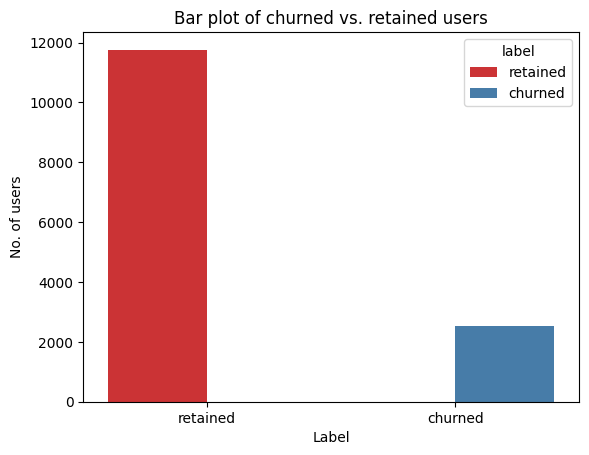

In [14]:
## create a bar plot
sns.countplot(x='label', order=["retained","churned"],hue='label', palette='Set1',data= df)
plt.title('Bar plot of churned vs. retained users')
plt.xlabel('Label')
plt.ylabel('No. of users')

**Obervation :**
- From the graph it is clearly seen the no of retained users are more than the churned users

In [15]:
# calculate the no. of churned vs. retained
print(df['label'].value_counts())

# calculate the proportion
print(df['label'].value_counts(normalize=True)*100)

retained    11763
churned      2536
Name: label, dtype: int64
retained    82.264494
churned     17.735506
Name: label, dtype: float64


**Observation:**
- The **class is balanced**; the proportion of retained vs. churned is 82.2% vs. 17.7%

In [16]:
# calculate the no. of Android vs. iPhone users
df_device = df['device'].value_counts()
df_device

iPhone     9672
Android    5327
Name: device, dtype: int64

Text(0, 0.5, 'No. of users')

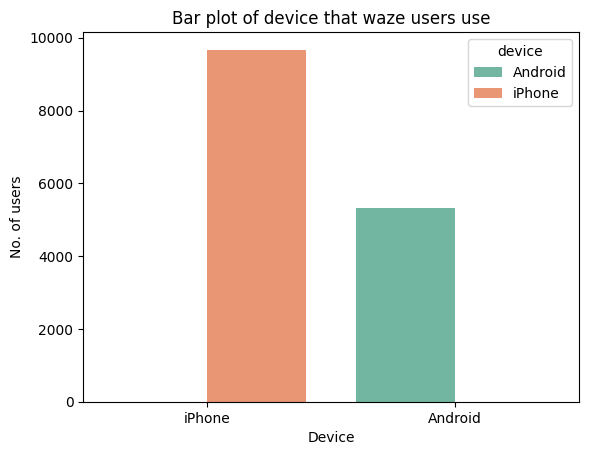

In [17]:
# create a bar plot
sns.countplot(x='device', order=["iPhone","Android"],hue='device', palette='Set2',data= df)
plt.title('Bar plot of device that waze users use')
plt.xlabel('Device')
plt.ylabel('No. of users')

**Observation :**
- From graph it is clearly seen that user uses iPhone over Android device

In [18]:
# calculate the no. of Android vs. iPhone users
print(df['device'].value_counts())

# calculate the proportion
print(df['device'].value_counts(normalize=True)*100)

iPhone     9672
Android    5327
Name: device, dtype: int64
iPhone     64.484299
Android    35.515701
Name: device, dtype: float64


**Observation:**
- 64.48% user uses iPhone & 35.51% users uses Android device

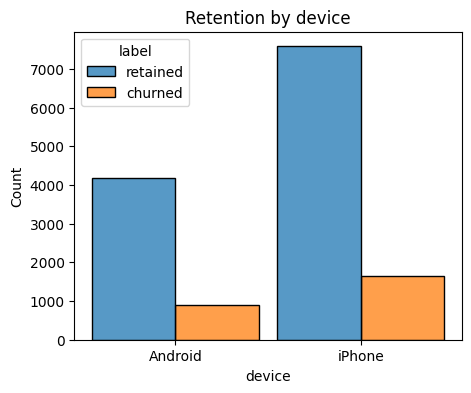

In [19]:
# Histogram
plt.figure(figsize=(5,4))
sns.histplot(data=df,
             x='device',
             hue='label',
             multiple='dodge',
             shrink=0.9
             )
plt.title('Retention by device');

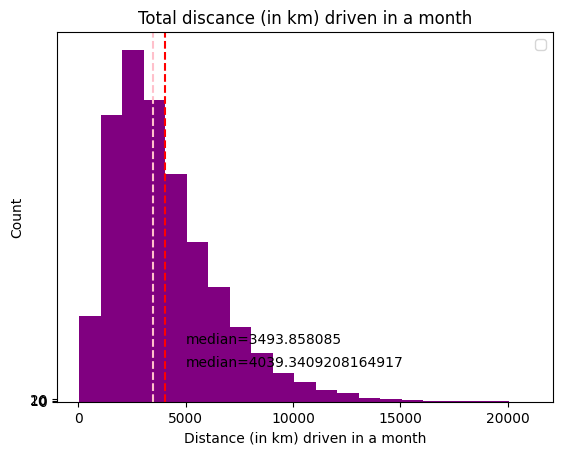

In [20]:
# plot histogram with matplotlib pyplot
plt.hist(df['driven_km_drives'], bins=range(50, 22000, 1000),color='purple')
plt.xticks(range(0,22000, 5000))
plt.yticks(range(0, 30, 10))
plt.xlabel('Distance (in km) driven in a month')
plt.ylabel('Count')
plt.title('Total discance (in km) driven in a month')

# Calculating the Mean and median
mean = df['driven_km_drives'].mean()
plt.axvline(mean, color='red', linestyle='--')
median = df['driven_km_drives'].median()
plt.axvline(median, color='pink', linestyle='--')
plt.text(5000,300, 'median='+str(mean), color='black')
plt.text(5000,500, 'median='+str(median), color='black')

plt.legend()
plt.show()

**Observation:**
- Right-skewed distribution

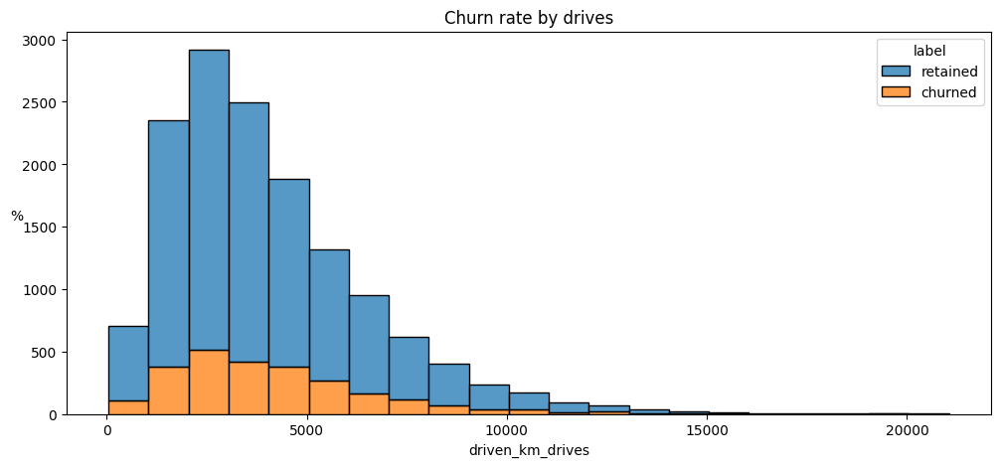

In [21]:
# Histogram
plt.figure(figsize=(12,5))
sns.histplot(data=df,
             x='driven_km_drives',
             bins=range(50, 22000, 1000),
             hue='label',
             multiple='stack')
plt.ylabel('%', rotation=0)
plt.title('Churn rate by drives');

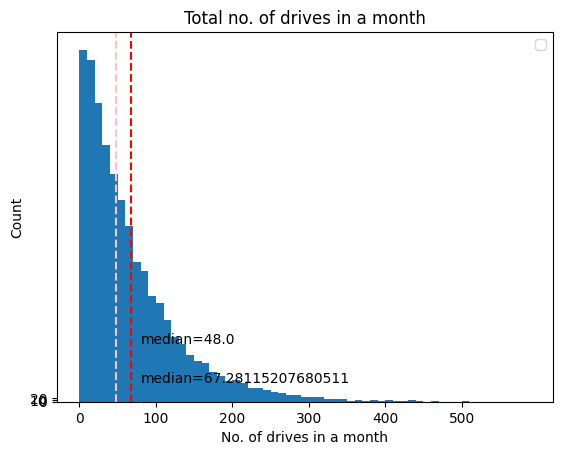

In [22]:
# plot histogram with matplotlib pyplot
plt.hist(df['drives'], bins=range(0, 600, 10))
plt.xticks(range(0,600, 100))
plt.yticks(range(0, 30, 10))
plt.xlabel('No. of drives in a month')
plt.ylabel('Count')
plt.title('Total no. of drives in a month')

# Claculating the mean and median
mean = df['drives'].mean()
plt.axvline(mean, color='red', linestyle='--')
median = df['drives'].median()
plt.axvline(median, color='pink', linestyle='--')
plt.text(80,100, 'median='+str(mean), color='black')
plt.text(80,300, 'median='+str(median), color='black')

plt.legend()
plt.show()

**Observation:**
- Right-skewed distribution

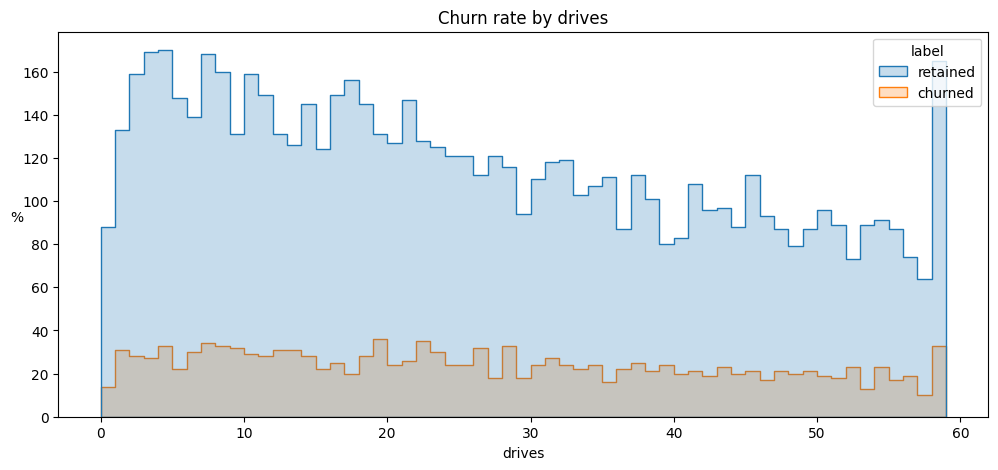

In [23]:
# Histogram
plt.figure(figsize=(12,5))
sns.histplot(data=df,
             x='drives',
             bins=range(0, 60),
             #bins=range(0, 600, 10),
             hue='label',
             element='step',
             )
plt.ylabel('%', rotation=0)
plt.title('Churn rate by drives');

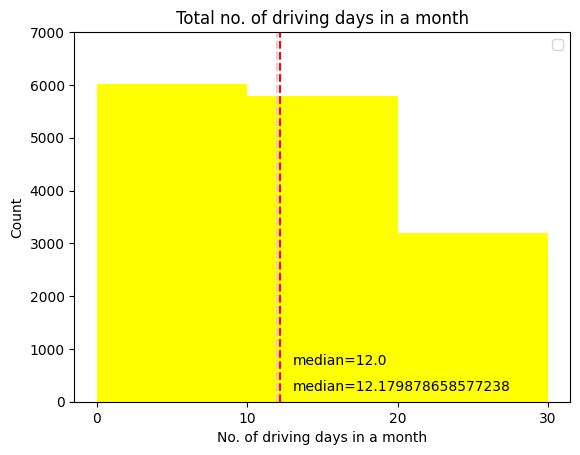

In [24]:
# plot histogram with matplotlib pyplot
plt.hist(df['driving_days'], bins=range(0, 40, 10),color='yellow')
plt.xticks(range(0, 40, 10))
plt.yticks(range(0, 8000, 1000))
plt.xlabel('No. of driving days in a month')
plt.ylabel('Count')
plt.title('Total no. of driving days in a month')

# calculating the mean and median
mean = df['driving_days'].mean()
plt.axvline(mean, color='red', linestyle='--')
median = df['driving_days'].median()
plt.axvline(median, color='pink', linestyle='--')
plt.text(13,200, 'median='+str(mean), color='Black')
plt.text(13,700, 'median='+str(median), color='Black')

plt.legend()
plt.show()

**Observation:**
- Uniform distribution

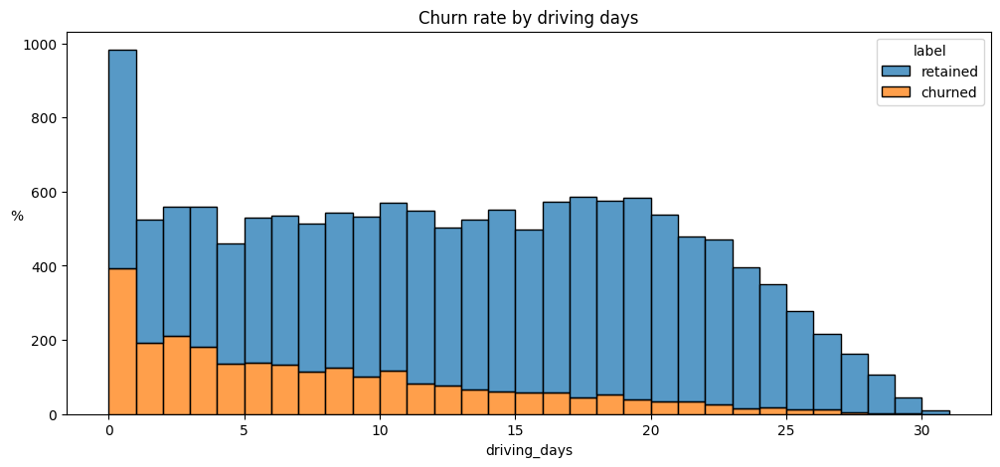

In [25]:
# Histogram
plt.figure(figsize=(12,5))
sns.histplot(data=df,
             x='driving_days',
             bins=range(0, 32),
             #bins=range(0, 40, 10),
             hue='label',
             multiple='stack')
plt.ylabel('%', rotation=0)
plt.title('Churn rate by driving days');

**Observation:**
- The more the people used the app while driving, less they churned.

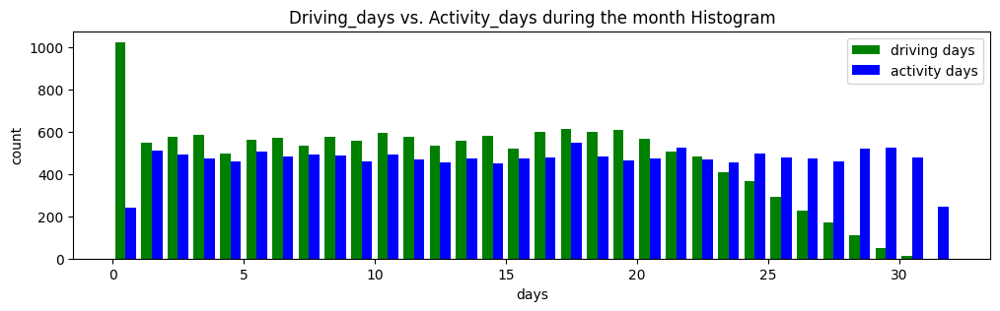

In [26]:
# # plot histogram with matplotlib pyplot
plt.figure(figsize=(12,3));
labels =['driving days', 'activity days']
plt.hist([df['driving_days'],df['activity_days']],bins=range(0,33),label=labels,color= {'green', 'blue'})
plt.title('Driving_days vs. Activity_days during the month Histogram')
plt.xlabel('days')
plt.ylabel('count')
plt.legend()
plt.show();

**Observation:**
- People are opening the app (activity_days) but not using it during driving (driving_days)
- Also, number of activity_days(>30) > number of driving_days for the same month? Some issue with the data?

In [27]:
max_driving_days = df['driving_days'].max()
print('MAX Driving Days ' + str(max_driving_days))
activity_days = df['activity_days'].max()
print('MAX Activity Days ' + str(activity_days))

MAX Driving Days 30
MAX Activity Days 31


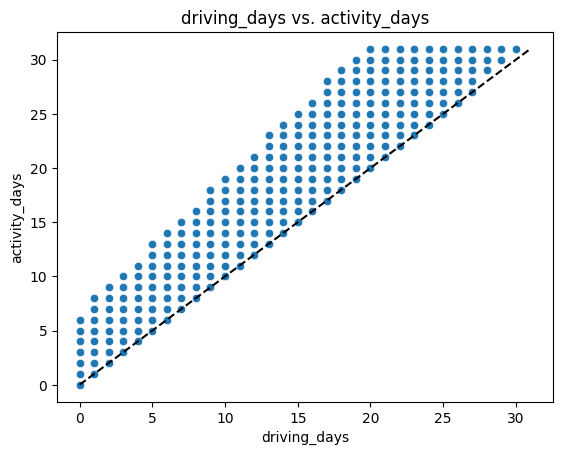

In [28]:
# Scatter plot
sns.scatterplot(data=df, x='driving_days', y='activity_days')
plt.title('driving_days vs. activity_days')
plt.plot([0,31], [0,31], color='black', linestyle='--');
plt.show()

**Observation:**
- Number of driving_days < Number of activity_days.

## Handling The Missing Values

In [29]:
# Checking for the missing vlaues
df.isnull().sum()

ID                           0
label                      700
sessions                     0
drives                       0
total_sessions               0
n_days_after_onboarding      0
total_navigations_fav1       0
total_navigations_fav2       0
driven_km_drives             0
duration_minutes_drives      0
activity_days                0
driving_days                 0
device                       0
dtype: int64

**Observation:**
- "lable" has 700 rows that have missing values
- Since "label" is a y-target variable, decided to exclude those 700 rows with missing data for ML model building

In [30]:
# Copy the data set
temp_df=df.copy()

In [31]:
# Deleting the missing values form data set
df1 =df.dropna()
df1

,ID,label,sessions,drives,total_sessions,n_days_after_onboarding,total_navigations_fav1,total_navigations_fav2,driven_km_drives,duration_minutes_drives,activity_days,driving_days,device
0,0,retained,283,226,296.748273,2276,208,0,2628.845068,1985.775061,28,19,Android
1,1,retained,133,107,326.896596,1225,19,64,13715.920550,3160.472914,13,11,iPhone
2,2,retained,114,95,135.522926,2651,0,0,3059.148818,1610.735904,14,8,Android
3,3,retained,49,40,67.589221,15,322,7,913.591123,587.196542,7,3,iPhone
4,4,retained,84,68,168.247020,1562,166,5,3950.202008,1219.555924,27,18,Android
...,...,...,...,...,...,...,...,...,...,...,...,...,...
14994,14994,retained,60,55,207.875622,140,317,0,2890.496901,2186.155708,25,17,iPhone
14995,14995,retained,42,35,187.670313,2505,15,10,4062.575194,1208.583193,25,20,Android
14996,14996,retained,273,219,422.017241,1873,17,0,3097.825028,1031.278706,18,17,iPhone
14997,14997,churned,149,120,180.524184,3150,45,0,4051.758549,254.187763,6,6,iPhone


In [32]:
df1.isnull().sum()

ID                         0
label                      0
sessions                   0
drives                     0
total_sessions             0
n_days_after_onboarding    0
total_navigations_fav1     0
total_navigations_fav2     0
driven_km_drives           0
duration_minutes_drives    0
activity_days              0
driving_days               0
device                     0
dtype: int64

In [33]:
df1.describe()

,ID,sessions,drives,total_sessions,n_days_after_onboarding,total_navigations_fav1,total_navigations_fav2,driven_km_drives,duration_minutes_drives,activity_days,driving_days
count,14299.000000,14299.000000,14299.000000,14299.000000,14299.000000,14299.000000,14299.000000,14299.000000,14299.000000,14299.000000,14299.000000
mean,7503.573117,80.623820,67.255822,189.547409,1751.822505,121.747395,29.638296,4044.401535,1864.199794,15.544653,12.182530
std,4331.207621,80.736502,65.947295,136.189764,1008.663834,147.713428,45.350890,2504.977970,1448.005047,9.016088,7.833835
min,0.000000,0.000000,0.000000,0.220211,4.000000,0.000000,0.000000,60.441250,18.282082,0.000000,0.000000
25%,3749.500000,23.000000,20.000000,90.457733,878.500000,10.000000,0.000000,2217.319909,840.181344,8.000000,5.000000
50%,7504.000000,56.000000,48.000000,158.718571,1749.000000,71.000000,9.000000,3496.545617,1479.394387,16.000000,12.000000
75%,11257.500000,111.000000,93.000000,253.540450,2627.500000,178.000000,43.000000,5299.972162,2466.928876,23.000000,19.000000
max,14998.000000,743.000000,596.000000,1216.154633,3500.000000,1236.000000,415.000000,21183.401890,15851.727160,31.000000,30.000000


In [34]:
df.shape

(14999, 13)

In [35]:
df1.shape

(14299, 13)

**Observation:**
- Verified that df1 does not contain rows with missing data
- 14999 - 14299 = 700

## Identify & handle outliers using the 1.5*IQR rule

In [36]:
df2=df1.copy()

In [37]:
# calculate 25th percentile of driven_km_drives
percentile25 = df2['driven_km_drives'].quantile(0.25)

# calculate 75th percentile of annual strikes
percentile75 = df2['driven_km_drives'].quantile(0.75)

# calculate interquartile range
iqr = percentile75 - percentile25

# calculate upper and lower thresholds for outliers
upper_limit = percentile75 + 1.5 * iqr
lower_limit = percentile25 - 1.5 * iqr

print('Lower limit is: ', lower_limit)
print('Outliers below upper limit is: ', df2[df2['driven_km_drives'] < lower_limit])
print()
print('Upper limit is: ', upper_limit)
print('Outliers above upper limit is: ', df2[df2['driven_km_drives'] > upper_limit])

Lower limit is:  -2406.65846925
Outliers below upper limit is:  Empty DataFrame
Columns: [ID, label, sessions, drives, total_sessions, n_days_after_onboarding, total_navigations_fav1, total_navigations_fav2, driven_km_drives, duration_minutes_drives, activity_days, driving_days, device]
Index: []

Upper limit is:  9923.95054075
Outliers above upper limit is:            ID     label  sessions  drives  total_sessions  \
1          1  retained       133     107      326.896596   
30        30  retained        78      66      484.571643   
48        48   churned        48      42      223.252729   
59        59  retained        23      20       24.464776   
62        62  retained        69      56       81.665854   
...      ...       ...       ...     ...             ...   
14872  14872   churned        54      54      327.221748   
14874  14874   churned       539     433      551.295691   
14895  14895  retained         1       1      142.095429   
14896  14896  retained        89      

**Observation:**
- There are 440 outliers in "driven_km_drives"
- 3% of outliers (440/14299 * 100 = 3%) in the dataset

<Axes: xlabel='driven_km_drives'>

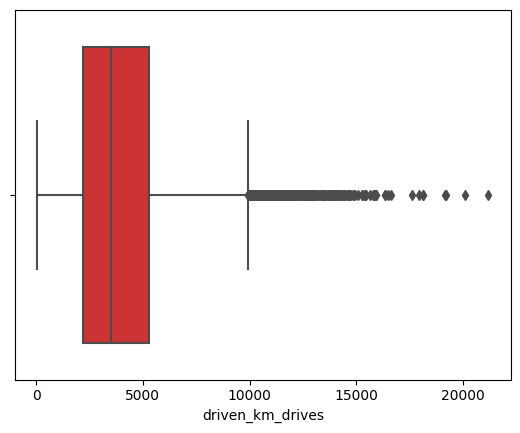

In [38]:
# Boxplot
sns.boxplot(x=df2['driven_km_drives'], palette='Set1',
            showfliers=True)

In [39]:
label_order = ['churned', 'retained']

<Axes: xlabel='driven_km_drives', ylabel='label'>

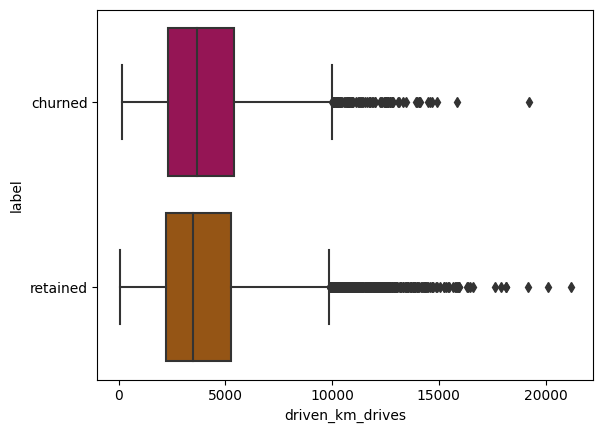

In [40]:
# box plot for "driven_km_drives"
sns.boxplot(x=df2['driven_km_drives'],
           y=df2['label'],
            order = label_order,palette='brg',
           showfliers=True)

In [41]:
# calculate 25th percentile of driven_km_drives
percentile25 =df2['drives'].quantile(0.25)

# Calculate 75th percentile of annual strikes
percentile75 = df2['drives'].quantile(0.75)

# Calculate interquartile range
iqr = percentile75 - percentile25

# Calculate upper and lower thresholds for outliers
upper_limit = percentile75 + 1.5 * iqr
lower_limit = percentile25 - 1.5 * iqr

print('Lower limit is: ', lower_limit)
print('Outliers below upper limit is: ', df2[df2['drives'] < lower_limit])
print()
print('Upper limit is: ', upper_limit)
print('Outliers above upper limit is: ',df2[df2['drives'] > upper_limit])

Lower limit is:  -89.5
Outliers below upper limit is:  Empty DataFrame
Columns: [ID, label, sessions, drives, total_sessions, n_days_after_onboarding, total_navigations_fav1, total_navigations_fav2, driven_km_drives, duration_minutes_drives, activity_days, driving_days, device]
Index: []

Upper limit is:  202.5
Outliers above upper limit is:            ID     label  sessions  drives  total_sessions  \
0          0  retained       283     226      296.748273   
17        17   churned       272     219      564.271485   
33        33  retained       291     233      568.722765   
63        63  retained       253     203      298.673647   
88        88  retained       306     246      320.257531   
...      ...       ...       ...     ...             ...   
14929  14929  retained       319     257      324.308061   
14942  14942  retained       299     239      446.971336   
14946  14946  retained       326     261      745.443028   
14968  14968   churned       333     267      623.28058

**Observation:**
- There are 695 outliers in "drives"
- 4.86% of outliers (695/14299 * 100 = 4.86%) in the dataset

<Axes: xlabel='drives'>

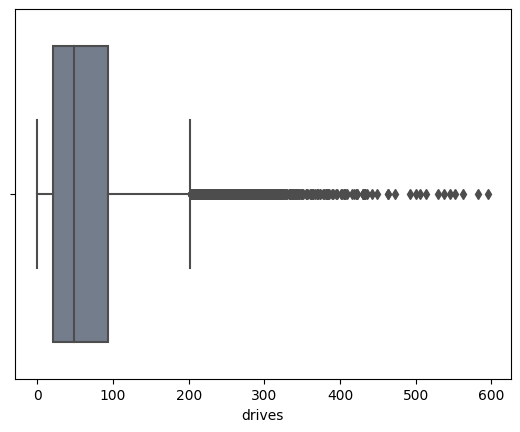

In [42]:
sns.boxplot(x=df2['drives'],  palette='bone',
            showfliers=True)

<Axes: xlabel='drives', ylabel='label'>

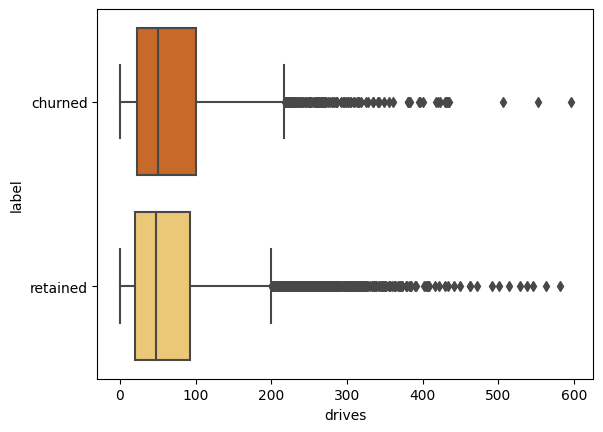

In [43]:
# box plot for 'drives'
sns.boxplot(x=df2['drives'],
            y=df2['label'],
            order = label_order, palette='YlOrBr_r',
            showfliers=True)

<Axes: xlabel='driving_days'>

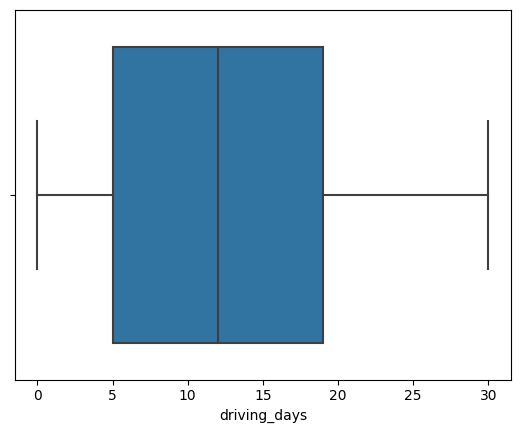

In [44]:
sns.boxplot(x=df2['driving_days'],
            showfliers=True)

In [45]:
# calculate 25th percentile of driving days
percentile25 = df2['driving_days'].quantile(0.25)

# Calculate 75th percentile of annual strikes
percentile75 = df2['driving_days'].quantile(0.75)

# Calculate interquartile range
iqr = percentile75 - percentile25

# Calculate upper and lower thresholds for outliers
upper_limit = percentile75 + 1.5 * iqr
lower_limit = percentile25 - 1.5 * iqr

print('Lower limit is: ', lower_limit)
print('Outliers below upper limit is: ', df2[df2['driving_days'] < lower_limit])
print()
print('Upper limit is: ', upper_limit)
print('Outliers above upper limit is: ', df2[df2['driving_days'] > upper_limit])

Lower limit is:  -16.0
Outliers below upper limit is:  Empty DataFrame
Columns: [ID, label, sessions, drives, total_sessions, n_days_after_onboarding, total_navigations_fav1, total_navigations_fav2, driven_km_drives, duration_minutes_drives, activity_days, driving_days, device]
Index: []

Upper limit is:  40.0
Outliers above upper limit is:  Empty DataFrame
Columns: [ID, label, sessions, drives, total_sessions, n_days_after_onboarding, total_navigations_fav1, total_navigations_fav2, driven_km_drives, duration_minutes_drives, activity_days, driving_days, device]
Index: []


**Observation:**
- No outliers were identified in "driving_days", but...

<Axes: xlabel='driving_days', ylabel='label'>

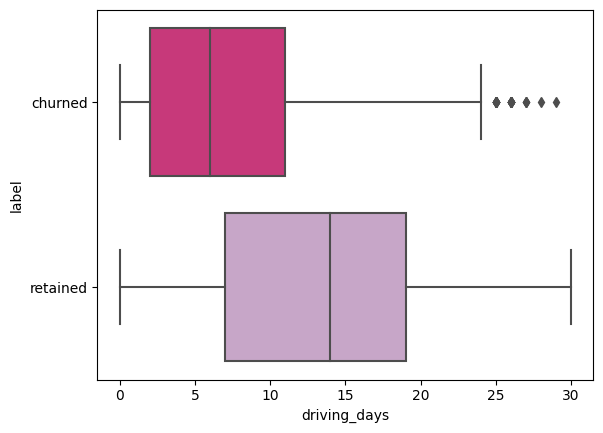

In [46]:
# box plot for 'drives'
sns.boxplot(x=df2['driving_days'],
            y=df2['label'],
            order = label_order, palette='PuRd_r',
            showfliers=True)

In [47]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 14299 entries, 0 to 14998
Data columns (total 13 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   ID                       14299 non-null  int64  
 1   label                    14299 non-null  object 
 2   sessions                 14299 non-null  int64  
 3   drives                   14299 non-null  int64  
 4   total_sessions           14299 non-null  float64
 5   n_days_after_onboarding  14299 non-null  int64  
 6   total_navigations_fav1   14299 non-null  int64  
 7   total_navigations_fav2   14299 non-null  int64  
 8   driven_km_drives         14299 non-null  float64
 9   duration_minutes_drives  14299 non-null  float64
 10  activity_days            14299 non-null  int64  
 11  driving_days             14299 non-null  int64  
 12  device                   14299 non-null  object 
dtypes: float64(3), int64(8), object(2)
memory usage: 1.5+ MB


In [48]:
df2.columns

Index(['ID', 'label', 'sessions', 'drives', 'total_sessions',
       'n_days_after_onboarding', 'total_navigations_fav1',
       'total_navigations_fav2', 'driven_km_drives', 'duration_minutes_drives',
       'activity_days', 'driving_days', 'device'],
      dtype='object')

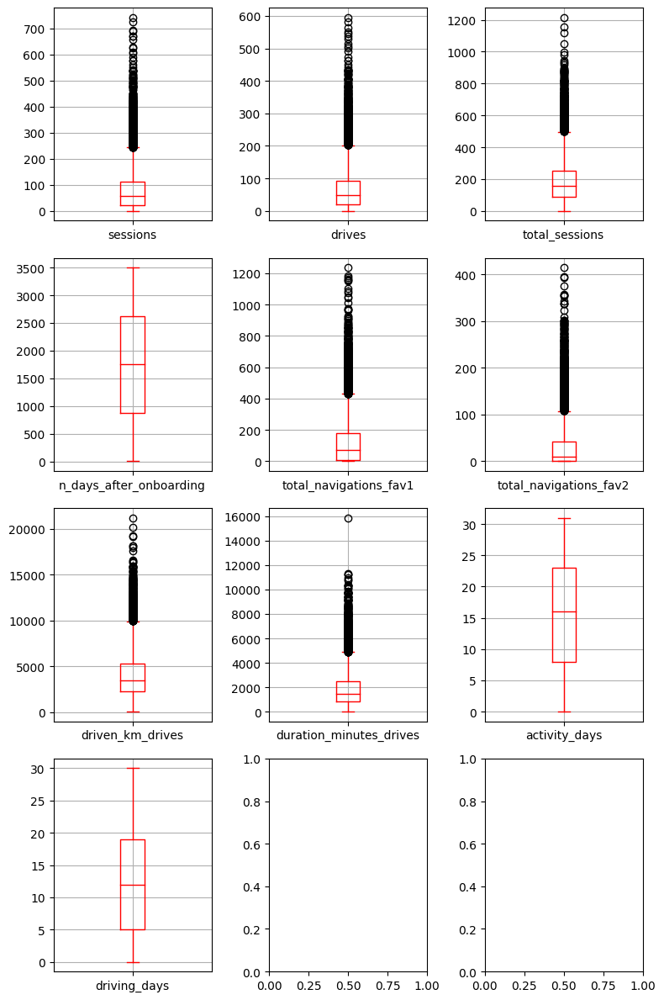

In [49]:
# List of numeric features for visualization
numeric = ['sessions', 'drives', 'total_sessions','n_days_after_onboarding',
           'total_navigations_fav1','total_navigations_fav2', 'driven_km_drives',
           'duration_minutes_drives','activity_days', 'driving_days']

# Calculating the number of plots and the number of rows and columns for the subplots
num_plots = len(numeric)
num_rows = (num_plots + 2) // 3
num_cols = min(num_plots, 3)

# Creating subplots based on the calculated number of rows and columns
# Setting the size of the figure as 8 inches by 12 inches
fig, axes = plt.subplots(num_rows, num_cols, figsize=(8, 12))
axes = axes.flatten()

# Iterating over the numeric features for creating box plots
for i, feat in enumerate(numeric):
    # Creating a box plot for the current feature and assigning it to the corresponding subplot
    df2[[feat]].boxplot(ax=axes[i],color='red')

# Adjusting the layout of the figure for better visualization
fig.tight_layout()

# Displaying the visualizations
plt.show()

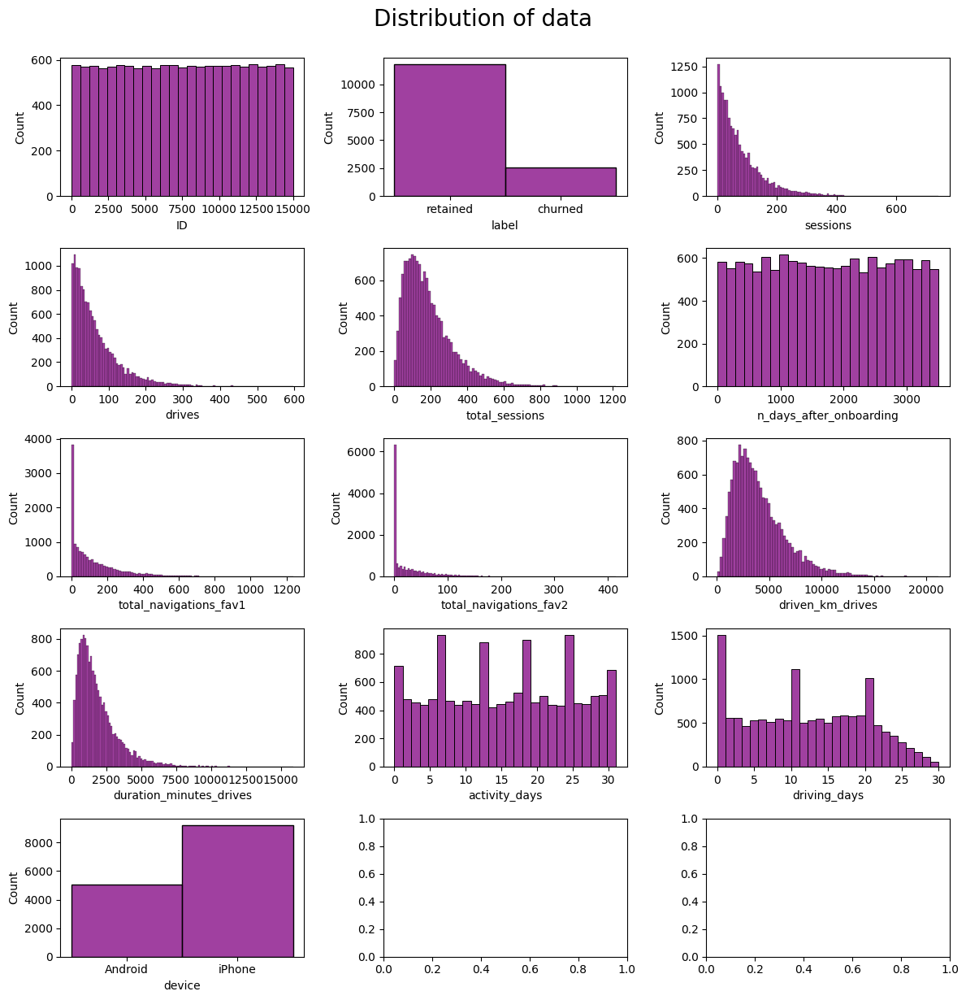

In [50]:
# Histplot
ncols = 3
nrows = np.ceil(len(df2.columns)/ncols).astype(int)
fig, axs = plt.subplots(ncols=ncols, nrows=nrows, figsize=(12,nrows*2.5))
for c, ax in zip(df2.columns, axs.flatten()):
    sns.histplot(df2, x=c, ax=ax, color='purple')
fig.suptitle('Distribution of data', fontsize=20)
plt.tight_layout(rect=[0, 0, 1, 0.98])

## Feature Engineering

In [51]:
# feature selection
# remove the the "ID" column from the dataframe by dropping it
df2 = df2.drop('ID', axis=1)

In [52]:
# feature extraction

# create `km_per_driving_day` column
df2['km_per_driving_day'] = df2['driven_km_drives'] / df2['driving_days']
df2['km_per_driving_day'].describe()

# imputes a value of infinity with 0
df2.loc[df2['km_per_driving_day']==np.inf, 'km_per_driving_day'] = 0

df2['km_per_driving_day'].describe()

count    14299.000000
mean       581.942399
std       1038.254509
min          0.000000
25%        136.168003
50%        273.301012
75%        558.018761
max      15420.234110
Name: km_per_driving_day, dtype: float64

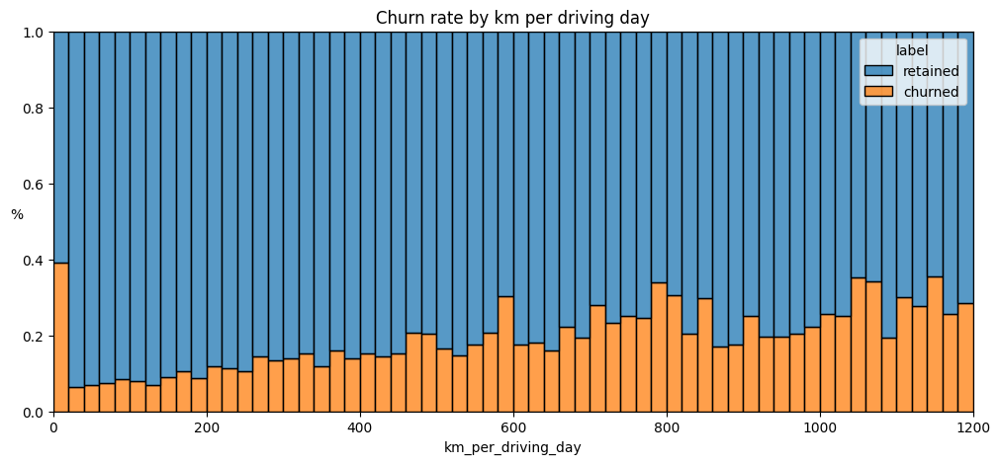

In [53]:
#Histplot
plt.figure(figsize=(12,5))
sns.histplot(data=df2,
             x='km_per_driving_day',
             bins=range(0,1201,20),#1201 size of the bin limits the km per driving day > 1200
             hue='label',
             multiple='fill')
plt.ylabel('%', rotation=0)
plt.title('Churn rate by km per driving day');

**Observation:**
- The longer the distance users drove in a day, the churn rate increased

In [54]:
# feature extraction

# create `professional_driver` column
df2['professional_driver'] = np.where((df2['drives'] >= 60) & (df2['driving_days'] >= 15), 1, 0)

In [55]:
# feature extraction

# count the number of professionals and non-professionals
print(df2['professional_driver'].value_counts())

print()

# verify churn rate by type
df2.groupby(['professional_driver'])['label'].value_counts(normalize=True)

0    11811
1     2488
Name: professional_driver, dtype: int64



professional_driver  label   
0                    retained    0.801202
                     churned     0.198798
1                    retained    0.924437
                     churned     0.075563
Name: label, dtype: float64

In [56]:
 # create `percentage_sessions_in_last_month` column
df2['percent_sessions_in_last_month'] = df2['sessions'] / df2['total_sessions']
 # Get descriptive stats
df2['percent_sessions_in_last_month'].describe()

count    14299.000000
mean         0.449837
std          0.286863
min          0.000000
25%          0.196890
50%          0.424310
75%          0.687251
max          1.530637
Name: percent_sessions_in_last_month, dtype: float64

In [57]:
 # create `total_sessions_per_day` column
df2['total_sessions_per_day'] = df2['total_sessions'] / df2['n_days_after_onboarding']
 # Get descriptive stats
df2['total_sessions_per_day'].describe()

count    14299.000000
mean         0.338207
std          1.319814
min          0.000298
25%          0.050818
50%          0.100457
75%          0.215210
max         39.763874
Name: total_sessions_per_day, dtype: float64

In [58]:
 # create `km_per_hour` column
df2['km_per_hour'] = df2['driven_km_drives'] / df2['duration_minutes_drives'] / 60
 # Get descriptive stats
df2['km_per_hour'].describe()

count    14299.000000
mean         0.052981
std          0.094424
min          0.020004
25%          0.025180
50%          0.033918
75%          0.053677
max          6.567478
Name: km_per_hour, dtype: float64

In [59]:
 # create `km_per_driving_day` column
df2['km_per_drive'] = df2['driven_km_drives'] / df2['drives']
 # Convert infinite values to zero
df2.loc[df2['km_per_drive']==np.inf, 'km_per_drive'] = 0

 # Get descriptive stats
df2['km_per_drive'].describe()

count    14299.000000
mean       232.269197
std        616.197409
min          0.000000
25%         32.486524
50%         72.947059
75%        179.347527
max      15777.426560
Name: km_per_drive, dtype: float64

In [60]:
# create `percentage_of_drives` column
df2['percent_of_drives_to_favorite'] = (
df2['total_navigations_fav1'] + df2['total_navigations_fav2']) / df2['total_sessions']

 # Get descriptive stats
df2['percent_of_drives_to_favorite'].describe()

count    14299.000000
mean         1.676347
std          9.021250
min          0.000000
25%          0.206064
50%          0.653572
75%          1.643183
max        777.563629
Name: percent_of_drives_to_favorite, dtype: float64

## feature transformation
- Converting categorica value to Numerical value

In [61]:
# feature transformation
print("BEFORE:")

print("values: ", df2['label'].unique())
print("dtype: ", df2['label'].dtype)

# data transformation
df2['label'] = df2['label'].replace({'retained': 0, 'churned': 1})

print()

print("AFTER:")

print("values: ", df2['label'].unique())
print("dtype: ", df2['label'].dtype)

BEFORE:
values:  ['retained' 'churned']
dtype:  object

AFTER:
values:  [0 1]
dtype:  int64


In [62]:
# feature transformation

print("BEFORE:")

print("values: ", df2['device'].unique())
print("dtype: ", df2['device'].dtype)

# data transformation
df2['device'] = df2['device'].replace({'Android': 0, 'iPhone': 1})

print()

print("AFTER:")

print("values: ", df2['label'].unique())
print("dtype: ", df2['label'].dtype)

BEFORE:
values:  ['Android' 'iPhone']
dtype:  object

AFTER:
values:  [0 1]
dtype:  int64


In [63]:
df2.head(5)

,label,sessions,drives,total_sessions,n_days_after_onboarding,total_navigations_fav1,total_navigations_fav2,driven_km_drives,duration_minutes_drives,activity_days,driving_days,device,km_per_driving_day,professional_driver,percent_sessions_in_last_month,total_sessions_per_day,km_per_hour,km_per_drive,percent_of_drives_to_favorite
0,0,283,226,296.748273,2276,208,0,2628.845068,1985.775061,28,19,0,138.360267,1,0.953670,0.130381,0.022064,11.632058,0.700931
1,0,133,107,326.896596,1225,19,64,13715.920550,3160.472914,13,11,1,1246.901868,0,0.406856,0.266854,0.072331,128.186173,0.253903
2,0,114,95,135.522926,2651,0,0,3059.148818,1610.735904,14,8,0,382.393602,0,0.841186,0.051121,0.031654,32.201567,0.000000
3,0,49,40,67.589221,15,322,7,913.591123,587.196542,7,3,1,304.530374,0,0.724968,4.505948,0.025931,22.839778,4.867640
4,0,84,68,168.247020,1562,166,5,3950.202008,1219.555924,27,18,0,219.455667,1,0.499266,0.107713,0.053984,58.091206,1.016363


In [64]:
df2.dtypes.sort_values(ascending=False)

percent_of_drives_to_favorite     float64
km_per_drive                      float64
total_sessions                    float64
km_per_hour                       float64
total_sessions_per_day            float64
percent_sessions_in_last_month    float64
driven_km_drives                  float64
duration_minutes_drives           float64
km_per_driving_day                float64
device                              int64
professional_driver                 int64
label                               int64
driving_days                        int64
sessions                            int64
total_navigations_fav2              int64
total_navigations_fav1              int64
n_days_after_onboarding             int64
drives                              int64
activity_days                       int64
dtype: object

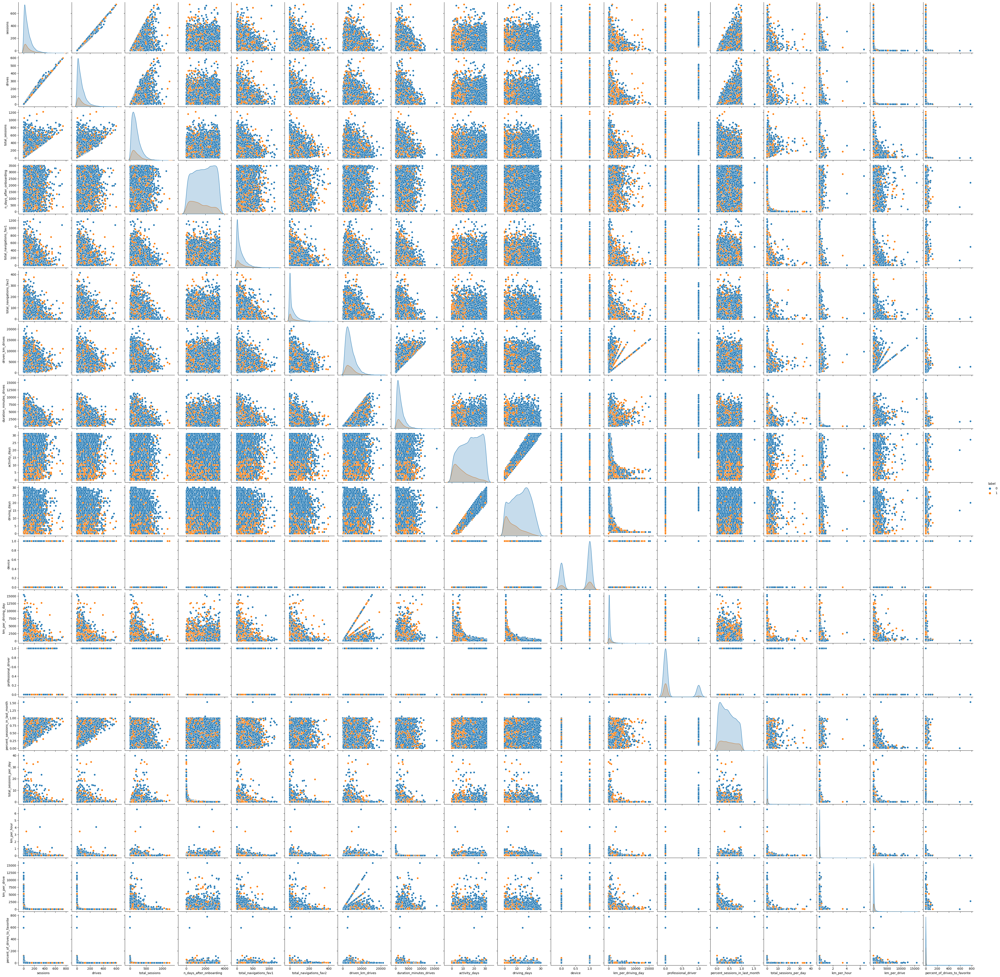

In [65]:
# Pairplot
sns.pairplot(df2,hue='label')
plt.show()

## Buliding Models

In [66]:
# binary logistic regression model
m1_df = df2.copy()

# naive bayes model
m2_df = df2.copy()

# random forest & XGBoost models
m3_df = df2.copy()

## Multicollinearity Check

In [67]:
# generating a correlation matrix
m1_df.corr(method='pearson')

,label,sessions,drives,total_sessions,n_days_after_onboarding,total_navigations_fav1,total_navigations_fav2,driven_km_drives,duration_minutes_drives,activity_days,driving_days,device,km_per_driving_day,professional_driver,percent_sessions_in_last_month,total_sessions_per_day,km_per_hour,km_per_drive,percent_of_drives_to_favorite
label,1.000000,0.038045,0.038548,0.025046,-0.129263,0.055537,0.020051,0.019050,0.035678,-0.303851,-0.294259,0.003406,0.148583,-0.122312,0.018018,0.048430,-0.014144,-0.000236,0.003231
sessions,0.038045,1.000000,0.996843,0.590265,0.006441,0.005252,0.005220,0.003815,-0.005800,0.024594,0.020228,0.014466,-0.008961,0.401584,0.575744,0.086476,0.009483,-0.281946,-0.091305
drives,0.038548,0.996843,1.000000,0.588118,0.006001,0.004551,0.006896,0.003708,-0.005376,0.024324,0.019975,0.013851,-0.008772,0.403413,0.576967,0.085342,0.010311,-0.285718,-0.092093
total_sessions,0.025046,0.590265,0.588118,1.000000,0.006180,-0.000047,0.007659,0.001690,-0.001457,0.012932,0.009798,0.013054,-0.015169,0.234289,-0.118816,0.161838,0.002900,-0.177003,-0.135417
n_days_after_onboarding,-0.129263,0.006441,0.006001,0.006180,1.000000,-0.004536,-0.006433,-0.005056,-0.010715,-0.009418,-0.007321,-0.011299,0.011764,0.003770,-0.000874,-0.302693,0.010772,0.004090,-0.007920
total_navigations_fav1,0.055537,0.005252,0.004551,-0.000047,-0.004536,1.000000,0.003734,-0.006262,0.005619,0.010318,0.010024,-0.000679,-0.000171,0.001257,0.014050,-0.001098,-0.011886,-0.004403,0.185002
total_navigations_fav2,0.020051,0.005220,0.006896,0.007659,-0.006433,0.003734,1.000000,0.000159,-0.005326,-0.004836,0.000938,0.001079,0.008992,0.003535,-0.002878,0.001684,0.008842,0.007310,0.036756
driven_km_drives,0.019050,0.003815,0.003708,0.001690,-0.005056,-0.006262,0.000159,1.000000,0.697977,-0.004196,-0.007099,-0.002309,0.355674,-0.002012,-0.005153,0.014342,0.102181,0.239580,-0.005672
duration_minutes_drives,0.035678,-0.005800,-0.005376,-0.001457,-0.010715,0.005619,-0.005326,0.697977,1.000000,-0.003898,-0.006239,-0.004312,0.245978,-0.009932,-0.011496,0.008513,-0.229380,0.180479,-0.001894
activity_days,-0.303851,0.024594,0.024324,0.012932,-0.009418,0.010318,-0.004836,-0.004196,-0.003898,1.000000,0.947687,-0.010221,-0.397433,0.453825,0.017840,-0.004602,-0.011961,-0.005193,0.009665


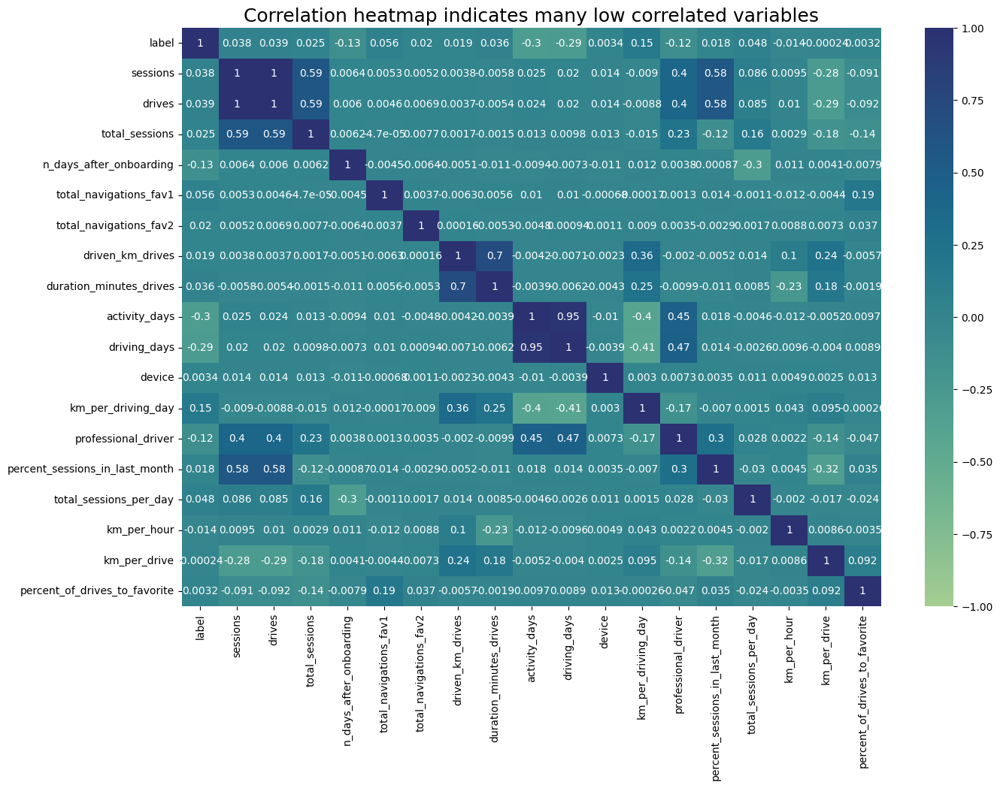

In [68]:
# plot correlation heatmap
plt.figure(figsize=(15,10))
sns.heatmap(m1_df.corr(method='pearson'), vmin=-1, vmax=1, annot=True, cmap='crest')
plt.title('Correlation heatmap indicates many low correlated variables',
          fontsize=18)
plt.show();

## Build a Binomial Logistic Regression Model

In [69]:
m1_df.columns

Index(['label', 'sessions', 'drives', 'total_sessions',
       'n_days_after_onboarding', 'total_navigations_fav1',
       'total_navigations_fav2', 'driven_km_drives', 'duration_minutes_drives',
       'activity_days', 'driving_days', 'device', 'km_per_driving_day',
       'professional_driver', 'percent_sessions_in_last_month',
       'total_sessions_per_day', 'km_per_hour', 'km_per_drive',
       'percent_of_drives_to_favorite'],
      dtype='object')

In [70]:
# impute outliers with the 95th percentile of each column
for column in ['driven_km_drives', 'drives', 'driving_days']:
    threshold = m1_df[column].quantile(0.95)
    m1_df.loc[m1_df[column] > threshold, column] = threshold

In [71]:
y = m1_df['label']
y

0        0
1        0
2        0
3        0
4        0
        ..
14994    0
14995    0
14996    0
14997    1
14998    0
Name: label, Length: 14299, dtype: int64

In [72]:
m1_df.columns

Index(['label', 'sessions', 'drives', 'total_sessions',
       'n_days_after_onboarding', 'total_navigations_fav1',
       'total_navigations_fav2', 'driven_km_drives', 'duration_minutes_drives',
       'activity_days', 'driving_days', 'device', 'km_per_driving_day',
       'professional_driver', 'percent_sessions_in_last_month',
       'total_sessions_per_day', 'km_per_hour', 'km_per_drive',
       'percent_of_drives_to_favorite'],
      dtype='object')

In [73]:
# drop the target and ulticolinearity redundant features; they are highly correlated features
X = m1_df.drop(columns = ['label', 'duration_minutes_drives', 'activity_days', 'sessions'])
X

,drives,total_sessions,n_days_after_onboarding,total_navigations_fav1,total_navigations_fav2,driven_km_drives,driving_days,device,km_per_driving_day,professional_driver,percent_sessions_in_last_month,total_sessions_per_day,km_per_hour,km_per_drive,percent_of_drives_to_favorite
0,200,296.748273,2276,208,0,2628.845068,19,0,138.360267,1,0.953670,0.130381,0.022064,11.632058,0.700931
1,107,326.896596,1225,19,64,8898.716275,11,1,1246.901868,0,0.406856,0.266854,0.072331,128.186173,0.253903
2,95,135.522926,2651,0,0,3059.148818,8,0,382.393602,0,0.841186,0.051121,0.031654,32.201567,0.000000
3,40,67.589221,15,322,7,913.591123,3,1,304.530374,0,0.724968,4.505948,0.025931,22.839778,4.867640
4,68,168.247020,1562,166,5,3950.202008,18,0,219.455667,1,0.499266,0.107713,0.053984,58.091206,1.016363
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14994,55,207.875622,140,317,0,2890.496901,17,1,170.029229,0,0.288634,1.484826,0.022036,52.554489,1.524950
14995,35,187.670313,2505,15,10,4062.575194,20,0,203.128760,0,0.223797,0.074918,0.056024,116.073577,0.133212
14996,200,422.017241,1873,17,0,3097.825028,17,1,182.225002,1,0.646893,0.225316,0.050064,14.145320,0.040283
14997,120,180.524184,3150,45,0,4051.758549,6,1,675.293092,0,0.825374,0.057309,0.265667,33.764655,0.249274


In [74]:
# perform the train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, random_state=44)

In [75]:
# build the logistic regression model
m1 = LogisticRegression(penalty='none', max_iter=400)

m1.fit(X_train, y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(


LogisticRegression(max_iter=400, penalty='none')

In [76]:
# calculate coefficients
pd.Series(m1.coef_[0], index=X.columns)

drives                            0.001959
total_sessions                    0.000058
n_days_after_onboarding          -0.000413
total_navigations_fav1            0.001070
total_navigations_fav2            0.001393
driven_km_drives                  0.000008
driving_days                     -0.119877
device                           -0.001189
km_per_driving_day               -0.000002
professional_driver              -0.002246
percent_sessions_in_last_month   -0.001449
total_sessions_per_day           -0.000509
km_per_hour                      -0.000294
km_per_drive                      0.000045
percent_of_drives_to_favorite    -0.000111
dtype: float64

In [77]:
# calculate intercept
m1.intercept_

array([-0.00322493])

## Analyze feature importance

In [78]:
# create a list of (column_name, coefficient) tuples
feature_importance = list(zip(X_train.columns, m1.coef_[0]))

# sort the list by coefficient value
feature_importance = sorted(feature_importance, key=lambda x: x[1], reverse=True)
feature_importance

[('drives', 0.001958941664751474),
 ('total_navigations_fav2', 0.0013934103849899758),
 ('total_navigations_fav1', 0.0010697917391784687),
 ('total_sessions', 5.762705506339374e-05),
 ('km_per_drive', 4.4681820663498076e-05),
 ('driven_km_drives', 7.715118907606624e-06),
 ('km_per_driving_day', -1.8072887941767561e-06),
 ('percent_of_drives_to_favorite', -0.00011116103125390042),
 ('km_per_hour', -0.00029380665719705196),
 ('n_days_after_onboarding', -0.00041251361110649623),
 ('total_sessions_per_day', -0.0005087490674407632),
 ('device', -0.0011892439509869944),
 ('percent_sessions_in_last_month', -0.0014488124959656905),
 ('professional_driver', -0.0022459779518409343),
 ('driving_days', -0.11987655498167743)]

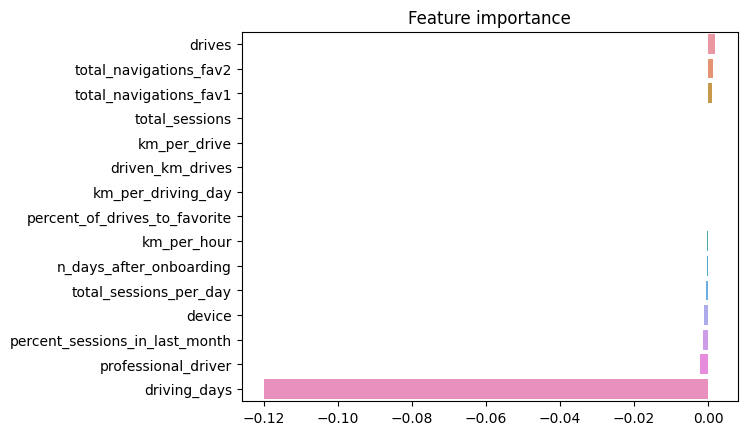

In [79]:
# plot the feature importances
import seaborn as sns
sns.barplot(x=[x[1] for x in feature_importance],
            y=[x[0] for x in feature_importance],
            orient='h')
plt.title('Feature importance');

**Observation:**

Variables most influenced the model's prediction are:
- The most influencial variable: "driving_days" has negative correlation with user churn
- The second influencial variable: "drives" has positive correlation with user churn
Variables least influenced the model's predictions are:
- "driven_km_drivers"
- "total_sessions"
- "km_per_driving_day"

##  Validate model assumptions

In [80]:
# call the model's predict_proba() method to generate the probability of response for each sample in the training data
# the first column is the probability of the user not churning, and the second column is the probability of the user churning.
training_probabilities = m1.predict_proba(X_train)
training_probabilities

array([[0.73673767, 0.26326233],
       [0.78436417, 0.21563583],
       [0.80832555, 0.19167445],
       ...,
       [0.6563734 , 0.3436266 ],
       [0.91611013, 0.08388987],
       [0.87642844, 0.12357156]])

In [81]:
# create a dataframe called logit_data that is a copy of X_train
logit_data = X_train.copy()

# create a new `logit` column in the `logit_data` dataframe
logit_data['logit'] = [np.log(prob[1] / prob[0]) for prob in training_probabilities]

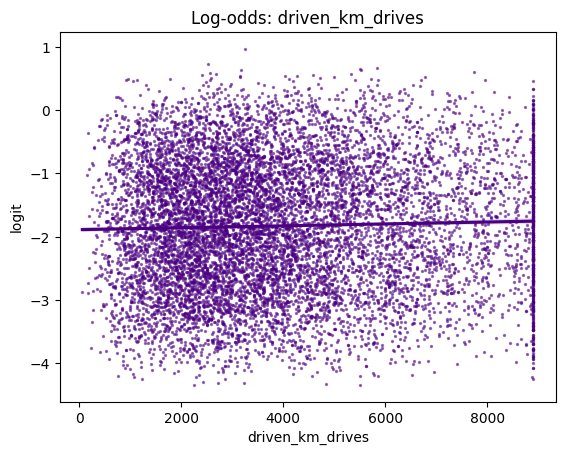

In [82]:
# plot a regplot where the x-axis represents an independent variable and the y-axis represents the log-odds of the predicted probabilities.

# 'driven_km_drives'
sns.regplot(x='driven_km_drives', y='logit', data=logit_data, scatter_kws={'s': 2, 'alpha': 0.5},color='indigo')
plt.title('Log-odds: driven_km_drives');

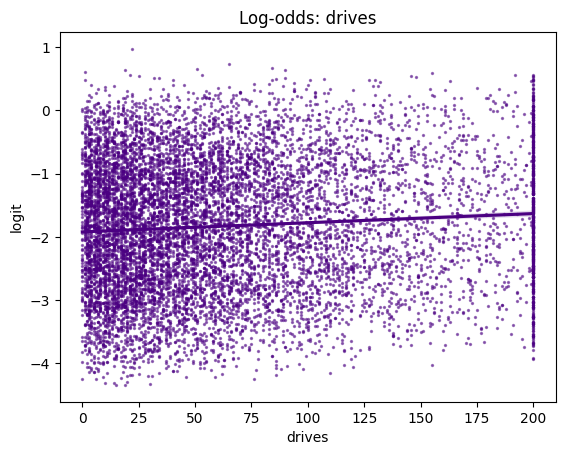

In [83]:
# 'drives'
sns.regplot(x='drives', y='logit', data=logit_data, scatter_kws={'s': 2, 'alpha': 0.5}, color='indigo')
plt.title('Log-odds: drives');

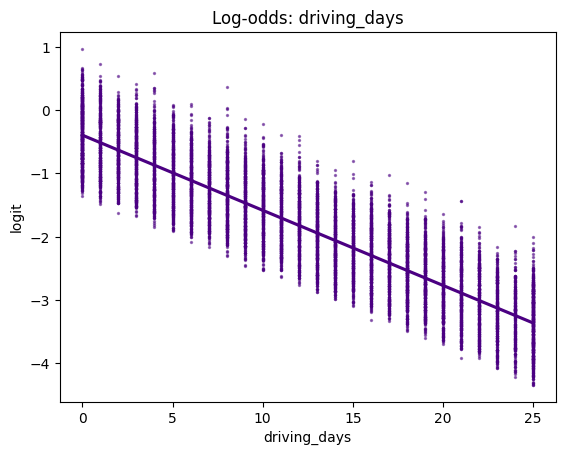

In [84]:
# 'driving_days'
sns.regplot(x='driving_days', y='logit', data=logit_data, scatter_kws={'s': 2, 'alpha': 0.5}, color='indigo')
plt.title('Log-odds: driving_days');

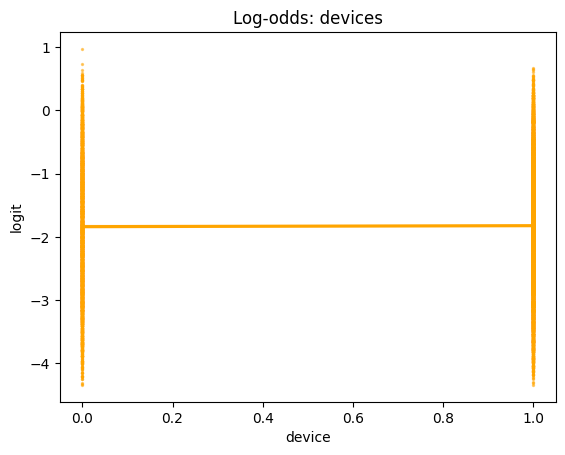

In [85]:
# 'device'
sns.regplot(x='device', y='logit', data=logit_data, scatter_kws={'s': 2, 'alpha': 0.5}, color='orange')
plt.title('Log-odds: devices');

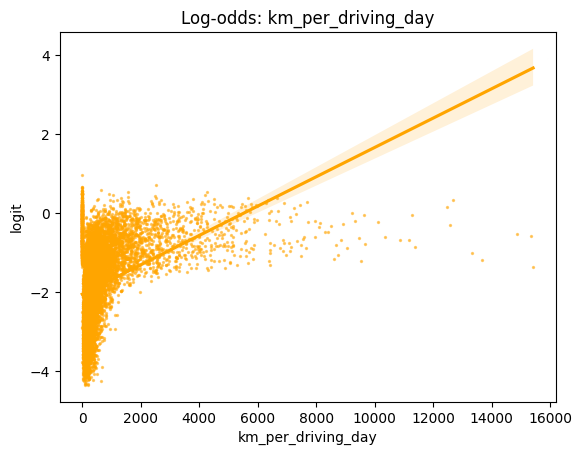

In [86]:
# 'km_per_driving_day'
sns.regplot(x='km_per_driving_day', y='logit', data=logit_data, scatter_kws={'s': 2, 'alpha': 0.5}, color='orange')
plt.title('Log-odds: km_per_driving_day');

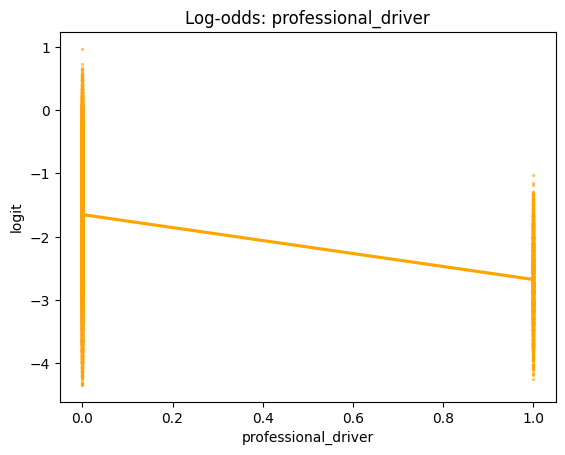

In [87]:
# 'professional_driver'
sns.regplot(x='professional_driver', y='logit', data=logit_data, scatter_kws={'s': 2, 'alpha': 0.5}, color='orange')
plt.title('Log-odds: professional_driver');

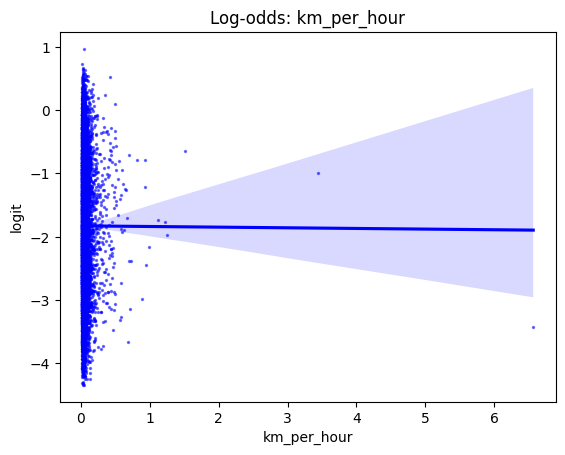

In [88]:
# 'km_per_hour'
sns.regplot(x='km_per_hour', y='logit', data=logit_data, scatter_kws={'s': 2, 'alpha': 0.5}, color='blue')
plt.title('Log-odds: km_per_hour');

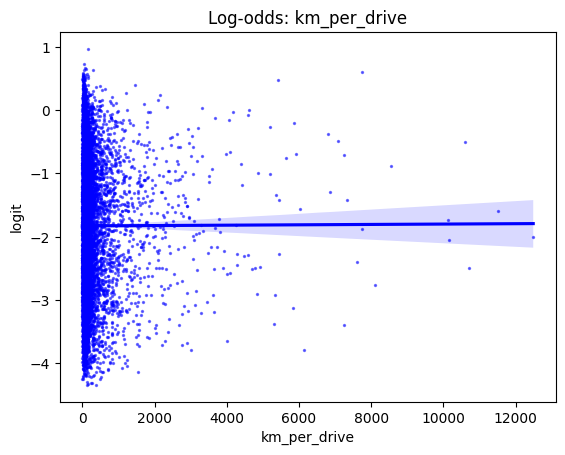

In [89]:
# 'km_per_drive'
sns.regplot(x='km_per_drive', y='logit', data=logit_data, scatter_kws={'s': 2, 'alpha': 0.5}, color='blue')
plt.title('Log-odds: km_per_drive');

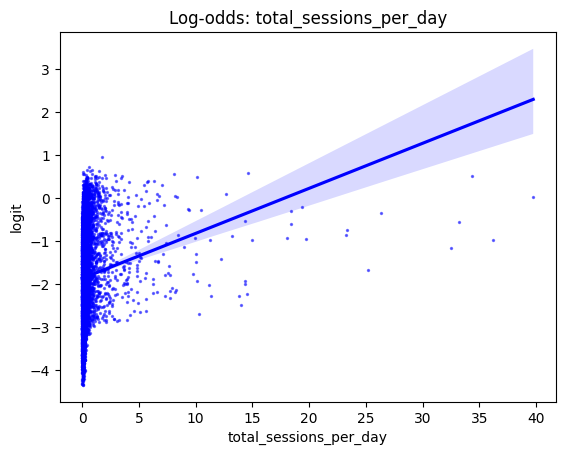

In [90]:
# 'total_sessions_per_day'
sns.regplot(x='total_sessions_per_day', y='logit', data=logit_data, scatter_kws={'s': 2, 'alpha': 0.5}, color='blue')
plt.title('Log-odds: total_sessions_per_day');

## Generate predictions

In [91]:
# generate predictions on X_test
y_preds = m1.predict(X_test)

In [92]:
pip install shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 533.5/533.5 kB 5.5 MB/s eta 0:00:00


## Analyze feature importance

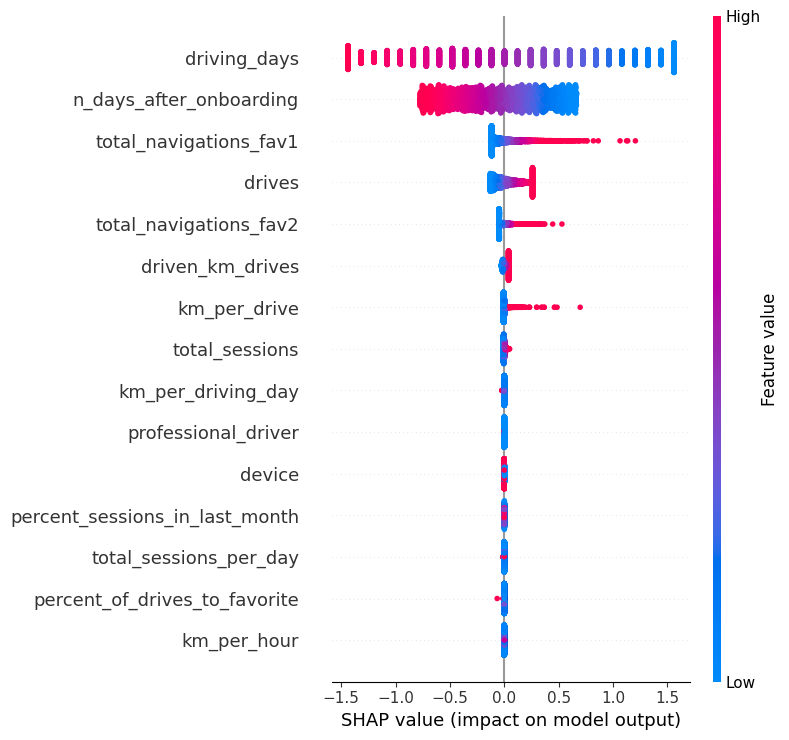

In [93]:
# method 1:
# importing the 'shap' module for generating SHAP summary plots
import shap

explainer = shap.LinearExplainer(m1, X_train)
shap_values = explainer.shap_values(X_test)

# Summary plot
shap.summary_plot(shap_values,
                  X_test,
                  feature_names=X.columns)

# Individual instance plot (for a specific data point)
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[0], X_test.iloc[0])

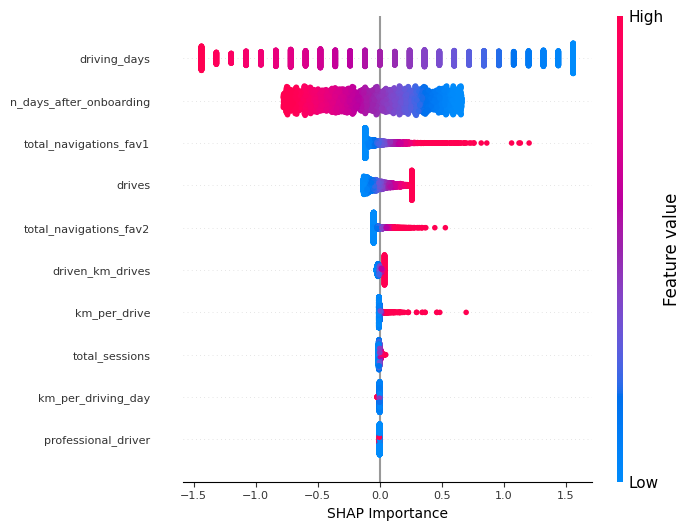

In [94]:
# method 2:
# importing the 'shap' module for generating SHAP summary plots
import shap

# Creating a summary plot of the SHAP values using the 'summary_plot' function
shap.summary_plot(shap_values,
                  X_test,
                  #plot_type="bar", # specify the type of plot as a bar chart
                  feature_names=X.columns, # The feature names
                  max_display=10,
                  show=False # suppress the automatic display of the plot
                 )

# Customizing the font size of the x and y ticks in the plot
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)

# Adding a label to the x-axis
plt.xlabel("SHAP Importance", fontsize=10)

# Displaying the plot
plt.show()

# Individual instance plot (for a specific data point)
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[0], X_test.iloc[0])

## Evaluate model's performance

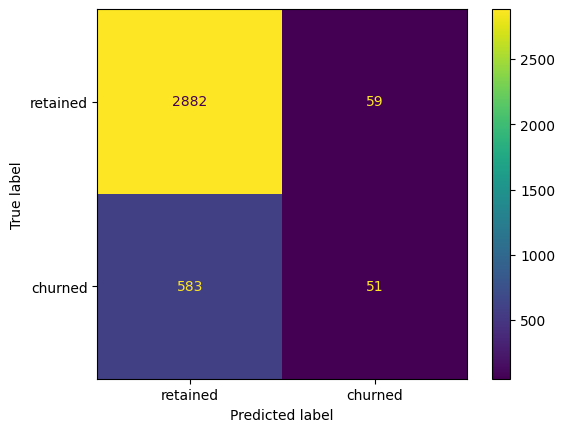

In [95]:
# generate a confusion matrix
cm = confusion_matrix(y_test, y_preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=['retained', 'churned'],
                              )
disp.plot();

In [96]:
# calculate accuracy
accuracy = m1.score(X_test, y_test)*100

# calculate precision
precision = cm[1,1] / (cm[0, 1] + cm[1, 1])*100

# calculate recall
recall = cm[1,1] / (cm[1, 0] + cm[1, 1])*100

# calcuate F1-score
from sklearn.metrics import f1_score
f1 = f1_score(y_test, y_preds)*100

# calcuate AUC
from sklearn.metrics import roc_auc_score
auc = roc_auc_score(y_test, y_preds)*100

In [97]:
# define a function
def print_eval_metrics (name, value):
    print('{:>10}: {}'.format(name, value))

# execute the function
print_eval_metrics('accuracy', accuracy)
print_eval_metrics('precision', precision)
print_eval_metrics('recall', recall)
print_eval_metrics('f1-score', f1)
print_eval_metrics('auc', auc)

  accuracy: 82.04195804195804
 precision: 46.36363636363636
    recall: 8.04416403785489
  f1-score: 13.70967741935484
       auc: 53.01902183531643


In [98]:
# generate a classification report
target_labels = ['retained', 'churned']
print(classification_report(y_test, y_preds, target_names=target_labels))

              precision    recall  f1-score   support

    retained       0.83      0.98      0.90      2941
     churned       0.46      0.08      0.14       634

    accuracy                           0.82      3575
   macro avg       0.65      0.53      0.52      3575
weighted avg       0.77      0.82      0.76      3575



**Observation:**
- The model has decent precision but very low recall, which means that it makes a lot of false negative predictions and fails to capture users who will churn.

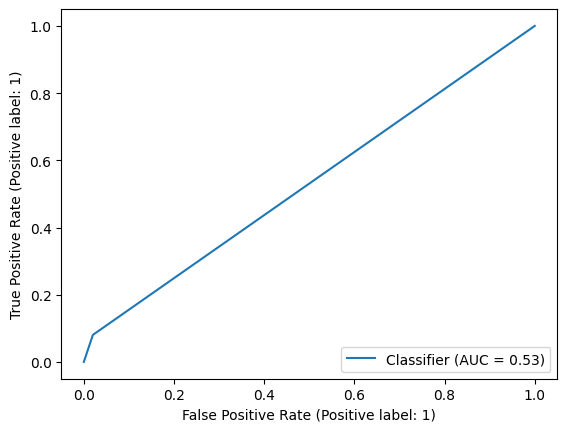

In [99]:
# generate ROC curves
import matplotlib.pyplot as plt
from sklearn.metrics import RocCurveDisplay

RocCurveDisplay.from_predictions(y_test, y_preds)
plt.show()

In [100]:
np.unique(y_preds)

array([0, 1])

In [101]:
X.describe()

,drives,total_sessions,n_days_after_onboarding,total_navigations_fav1,total_navigations_fav2,driven_km_drives,driving_days,device,km_per_driving_day,professional_driver,percent_sessions_in_last_month,total_sessions_per_day,km_per_hour,km_per_drive,percent_of_drives_to_favorite
count,14299.000000,14299.000000,14299.000000,14299.000000,14299.000000,14299.000000,14299.000000,14299.000000,14299.000000,14299.000000,14299.000000,14299.000000,14299.000000,14299.000000,14299.000000
mean,63.964683,189.547409,1751.822505,121.747395,29.638296,3944.558631,12.106371,0.645150,581.942399,0.173998,0.449837,0.338207,0.052981,232.269197,1.676347
std,55.127927,136.189764,1008.663834,147.713428,45.350890,2218.358258,7.695161,0.478485,1038.254509,0.379121,0.286863,1.319814,0.094424,616.197409,9.021250
min,0.000000,0.220211,4.000000,0.000000,0.000000,60.441250,0.000000,0.000000,0.000000,0.000000,0.000000,0.000298,0.020004,0.000000,0.000000
25%,20.000000,90.457733,878.500000,10.000000,0.000000,2217.319909,5.000000,0.000000,136.168003,0.000000,0.196890,0.050818,0.025180,32.486524,0.206064
50%,48.000000,158.718571,1749.000000,71.000000,9.000000,3496.545617,12.000000,1.000000,273.301012,0.000000,0.424310,0.100457,0.033918,72.947059,0.653572
75%,93.000000,253.540450,2627.500000,178.000000,43.000000,5299.972162,19.000000,1.000000,558.018761,0.000000,0.687251,0.215210,0.053677,179.347527,1.643183
max,200.000000,1216.154633,3500.000000,1236.000000,415.000000,8898.716275,25.000000,1.000000,15420.234110,1.000000,1.530637,39.763874,6.567478,15777.426560,777.563629


## Naive Bayes Model

In [102]:
# import packages and libraries for data manipulation
from sklearn import naive_bayes
from sklearn import model_selection
from sklearn import metrics

# "CV" stands for cross validation
from sklearn.model_selection import GridSearchCV

from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier

from xgboost import plot_importance

import pickle

In [103]:
# impute outliers with the 95th percentile of each column
for column in ['driven_km_drives', 'drives', 'driving_days']:
    threshold = m2_df[column].quantile(0.95)
    m2_df.loc[m1_df[column] > threshold, column] = threshold

In [104]:
y = m2_df['label']
y

0        0
1        0
2        0
3        0
4        0
        ..
14994    0
14995    0
14996    0
14997    1
14998    0
Name: label, Length: 14299, dtype: int64

In [105]:
# drop the target and ulticolinearity redundant features; they are highly correlated features
X = m2_df.drop(columns = ['label', 'duration_minutes_drives', 'activity_days', 'sessions'])
X

,drives,total_sessions,n_days_after_onboarding,total_navigations_fav1,total_navigations_fav2,driven_km_drives,driving_days,device,km_per_driving_day,professional_driver,percent_sessions_in_last_month,total_sessions_per_day,km_per_hour,km_per_drive,percent_of_drives_to_favorite
0,226,296.748273,2276,208,0,2628.845068,19,0,138.360267,1,0.953670,0.130381,0.022064,11.632058,0.700931
1,107,326.896596,1225,19,64,13715.920550,11,1,1246.901868,0,0.406856,0.266854,0.072331,128.186173,0.253903
2,95,135.522926,2651,0,0,3059.148818,8,0,382.393602,0,0.841186,0.051121,0.031654,32.201567,0.000000
3,40,67.589221,15,322,7,913.591123,3,1,304.530374,0,0.724968,4.505948,0.025931,22.839778,4.867640
4,68,168.247020,1562,166,5,3950.202008,18,0,219.455667,1,0.499266,0.107713,0.053984,58.091206,1.016363
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14994,55,207.875622,140,317,0,2890.496901,17,1,170.029229,0,0.288634,1.484826,0.022036,52.554489,1.524950
14995,35,187.670313,2505,15,10,4062.575194,20,0,203.128760,0,0.223797,0.074918,0.056024,116.073577,0.133212
14996,219,422.017241,1873,17,0,3097.825028,17,1,182.225002,1,0.646893,0.225316,0.050064,14.145320,0.040283
14997,120,180.524184,3150,45,0,4051.758549,6,1,675.293092,0,0.825374,0.057309,0.265667,33.764655,0.249274


In [106]:
# perform the train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, random_state=44)

In [107]:
# Naive Bayes
nb = naive_bayes.GaussianNB()

nb.fit(X_train, y_train)

y_preds_nb = nb.predict(X_test)

## Evaluate model's performance

In [108]:
accuracy = metrics.accuracy_score(y_test, y_preds_nb)*100
precision = metrics.precision_score(y_test, y_preds_nb)*100
recall = metrics.recall_score(y_test, y_preds_nb)*100
f1 = metrics.f1_score(y_test, y_preds_nb)*100
auc = metrics.roc_auc_score(y_test, y_preds_nb)*100


# define a function
def print_eval_metrics (name, value):
    print('{:>10}: {}'.format(name, value))

# execute the function
print_eval_metrics('accuracy', accuracy)
print_eval_metrics('precision', precision)
print_eval_metrics('recall', recall)
print_eval_metrics('f1-score', f1)
print_eval_metrics('auc', auc)

  accuracy: 78.26573426573427
 precision: 34.146341463414636
    recall: 24.290220820189273
  f1-score: 28.387096774193548
       auc: 57.095807451917146


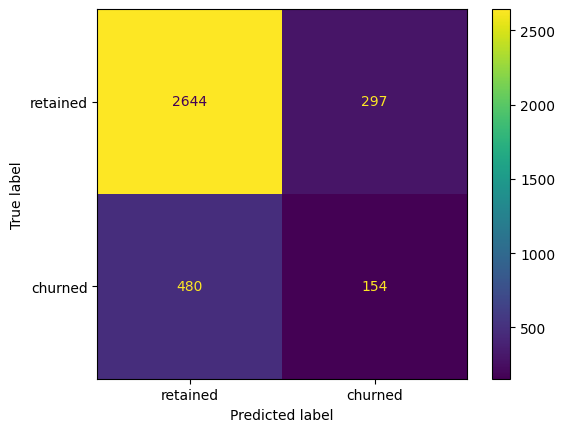

In [109]:
# generate a confusion matrix
cm = confusion_matrix(y_test, y_preds_nb)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=['retained', 'churned'],
                              )
disp.plot();

In [110]:
np.unique(y_preds_nb)

array([0, 1])

## Random forest Model

In [111]:
y = m3_df['label']
y

# drop the target and ulticolinearity redundant features; they are highly correlated features
X = m3_df.drop(columns = ['label', 'duration_minutes_drives', 'activity_days', 'sessions'])
X

,drives,total_sessions,n_days_after_onboarding,total_navigations_fav1,total_navigations_fav2,driven_km_drives,driving_days,device,km_per_driving_day,professional_driver,percent_sessions_in_last_month,total_sessions_per_day,km_per_hour,km_per_drive,percent_of_drives_to_favorite
0,226,296.748273,2276,208,0,2628.845068,19,0,138.360267,1,0.953670,0.130381,0.022064,11.632058,0.700931
1,107,326.896596,1225,19,64,13715.920550,11,1,1246.901868,0,0.406856,0.266854,0.072331,128.186173,0.253903
2,95,135.522926,2651,0,0,3059.148818,8,0,382.393602,0,0.841186,0.051121,0.031654,32.201567,0.000000
3,40,67.589221,15,322,7,913.591123,3,1,304.530374,0,0.724968,4.505948,0.025931,22.839778,4.867640
4,68,168.247020,1562,166,5,3950.202008,18,0,219.455667,1,0.499266,0.107713,0.053984,58.091206,1.016363
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14994,55,207.875622,140,317,0,2890.496901,17,1,170.029229,0,0.288634,1.484826,0.022036,52.554489,1.524950
14995,35,187.670313,2505,15,10,4062.575194,20,0,203.128760,0,0.223797,0.074918,0.056024,116.073577,0.133212
14996,219,422.017241,1873,17,0,3097.825028,17,1,182.225002,1,0.646893,0.225316,0.050064,14.145320,0.040283
14997,120,180.524184,3150,45,0,4051.758549,6,1,675.293092,0,0.825374,0.057309,0.265667,33.764655,0.249274


In [112]:
# split into train and test datasets
X_tr, X_test, y_tr, y_test = train_test_split(X, y, stratify=y,
                                              test_size=0.2, random_state=42)

# split into train and validate datasets
X_train, X_val, y_train, y_val = train_test_split(X_tr, y_tr, stratify=y_tr,
                                                  test_size=0.25, random_state=42)

for x in [X_train, X_val, X_test]:
    print(len(x))

8579
2860
2860


## Evaluate models using cross validation and grid search



In [113]:
# 1. Instantiate the random forest classifier
rf = RandomForestClassifier(random_state=42)

# 2. Create a dictionary of hyperparameters to tune
cv_params = {'max_depth': [None],
             'max_features': [1.0],
             'max_samples': [1.0],
             'min_samples_leaf': [2],
             'min_samples_split': [2],
             'n_estimators': [300],
             }

# 3. Define a dictionary of scoring metrics to capture
scoring = {'accuracy', 'precision', 'recall', 'f1'}

# 4. Instantiate the GridSearchCV object
rf_cv = GridSearchCV(rf, cv_params, scoring=scoring, cv=4, refit='recall')

In [114]:
%%time
rf_cv.fit(X_train, y_train)

CPU times: user 2min 15s, sys: 214 ms, total: 2min 15s
Wall time: 2min 31s


GridSearchCV(cv=4, estimator=RandomForestClassifier(random_state=42),
             param_grid={'max_depth': [None], 'max_features': [1.0],
                         'max_samples': [1.0], 'min_samples_leaf': [2],
                         'min_samples_split': [2], 'n_estimators': [300]},
             refit='recall', scoring={'f1', 'precision', 'recall', 'accuracy'})

In [115]:
# examine best score
rf_cv.best_score_

0.11168324354192567

In [116]:
# Examine best hyperparameter combo
rf_cv.best_params_

{'max_depth': None,
 'max_features': 1.0,
 'max_samples': 1.0,
 'min_samples_leaf': 2,
 'min_samples_split': 2,
 'n_estimators': 300}

## Evaluate model's performance

In [117]:
# define a  function
def make_results(model_name:str, model_object, metric:str):
  # Create dictionary that maps input metric to actual metric name in GridSearchCV
    metric_dict = {'precision': 'mean_test_precision',
                   'recall': 'mean_test_recall',
                   'f1': 'mean_test_f1',
                   'accuracy': 'mean_test_accuracy',

                   }

    # Get all the results from the CV and put them in a df
    cv_results = pd.DataFrame(model_object.cv_results_)

    # Isolate the row of the df with the max(metric) score
    best_estimator_results = cv_results.iloc[cv_results[metric_dict[metric]].idxmax(), :]

    # Extract accuracy, precision, recall, and f1 score from that row
    f1 = best_estimator_results.mean_test_f1
    recall = best_estimator_results.mean_test_recall
    precision = best_estimator_results.mean_test_precision
    accuracy = best_estimator_results.mean_test_accuracy


    # Create table of results
    table = pd.DataFrame({'model': [model_name],
                          'precision': [precision],
                          'recall': [recall],
                          'F1': [f1],
                          'accuracy': [accuracy],

                          },
                         )

    return table

In [118]:
# execute the function
results = make_results('RF cv', rf_cv, 'recall')
results

,model,precision,recall,F1,accuracy
0,RF cv,0.456987,0.111683,0.179478,0.81886


**Observation:**
- Asside from the accuracy, the scores aren't that good. However, recall that when we built the
 logistic regression model in the last course the recall was ~0.09, which means that this model has
 33% better recall and about the same accuracy, and it was trained on less data.

## XGBoost Model

In [119]:
# 1. Instantiate the XGBoost classifier
xgb = XGBClassifier(objective='binary:logistic', random_state=42)

# 2. Create a dictionary of hyperparameters to tune
cv_params = {'max_depth': [6, 12],
             'min_child_weight': [3, 5],
             'learning_rate': [0.01, 0.1],
             'n_estimators': [300]
             }

# 3. Define a dictionary of scoring metrics to capture
scoring = {'accuracy', 'precision', 'recall', 'f1'}

# 4. Instantiate the GridSearchCV object
xgb_cv = GridSearchCV(xgb, cv_params, scoring=scoring, cv=4, refit='recall')

In [120]:
%%time
xgb_cv.fit(X_train, y_train)

CPU times: user 1min 2s, sys: 499 ms, total: 1min 3s
Wall time: 1min 5s


GridSearchCV(cv=4,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=42, ...),
             param_grid={'learning_rate': [0.01, 0.1], 'max_depth': [6, 12],
                         'min_child_weight': [3, 5], 'n_estimators': [300]},
             refit='recall', scoring={'f1', 'precision', 'recall', 'accuracy'})

In [121]:
xgb_cv.best_score_

0.15902058295344662

In [122]:
# Examine best parameters
xgb_cv.best_params_

{'learning_rate': 0.1,
 'max_depth': 12,
 'min_child_weight': 5,
 'n_estimators': 300}

In [123]:
# Call 'make_results()' on the GridSearch object
xgb_cv_results = make_results('XGB cv', xgb_cv, 'recall')
results = pd.concat([results, xgb_cv_results], axis=0)
results

,model,precision,recall,F1,accuracy
0,RF cv,0.456987,0.111683,0.179478,0.818860
0,XGB cv,0.400671,0.159021,0.227321,0.808719


**Observation:**

This model fit the data even better than the random forest model. The recall score is nearly double the recall score from the logistic regression model from the previous course, and it's almost 50% better than the random forest model's recall score, while maintaining a similar accuracy and precision score

In [124]:
import xgboost as xgb
m3 = xgb.XGBClassifier()
m3.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

**Model selection :**

 Use the best random forest model and the best XGBoost model to predict on the validation data. Whichever performs better will be selected as the champion model.

In [125]:
# Use random forest model to predict on validation data
rf_val_preds = rf_cv.best_estimator_.predict(X_val)

In [126]:
def get_test_scores(model_name:str, preds, y_test_data):
  accuracy = accuracy_score(y_test_data, preds)
  precision = precision_score(y_test_data, preds)
  recall = recall_score(y_test_data, preds)
  f1 = f1_score(y_test_data, preds)

  table = pd.DataFrame({'model': [model_name],
                          'precision': [precision],
                          'recall': [recall],
                          'F1': [f1],
                          'accuracy': [accuracy]
                          })

  return table

In [127]:
# Get validation scores for RF model
rf_val_scores = get_test_scores('RF val', rf_val_preds, y_val)

# Append to the results table
results = pd.concat([results, rf_val_scores], axis=0)
results

,model,precision,recall,F1,accuracy
0,RF cv,0.456987,0.111683,0.179478,0.818860
0,XGB cv,0.400671,0.159021,0.227321,0.808719
0,RF val,0.482993,0.140039,0.217125,0.820979


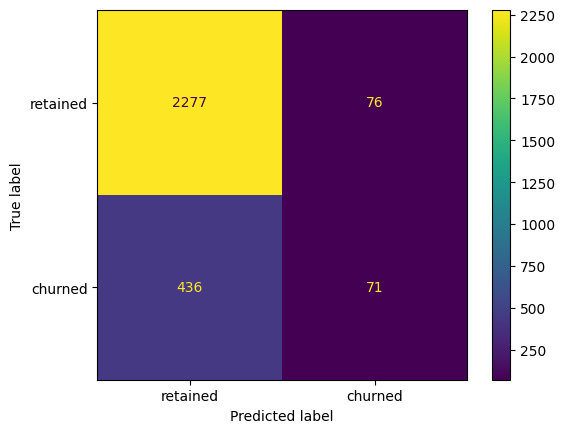

In [128]:
# generate a confusion matrix
cm = confusion_matrix(y_val, rf_val_preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=['retained', 'churned'],
                              )
disp.plot();

In [129]:
# Use XGBoost model to predict on validation data
xgb_val_preds = xgb_cv.best_estimator_.predict(X_val)
 # Get validation scores for XGBoost model
xgb_val_scores = get_test_scores('XGB val', xgb_val_preds, y_val)
 # Append to the results table
results = pd.concat([results, xgb_val_scores], axis=0)
results

,model,precision,recall,F1,accuracy
0,RF cv,0.456987,0.111683,0.179478,0.818860
0,XGB cv,0.400671,0.159021,0.227321,0.808719
0,RF val,0.482993,0.140039,0.217125,0.820979
0,XGB val,0.393013,0.177515,0.244565,0.805594


**Observation :**
- XGB validation scores are the better than the rest. XGB is the best model or the champion model

## Use champion model to predict on test data

In [130]:
# Use XGBoost model to predict on test data
xgb_test_preds = xgb_cv.best_estimator_.predict(X_test)
 # Get test scores for XGBoost model
xgb_test_scores = get_test_scores('XGB test', xgb_test_preds, y_test)
 # Append to the results table
results = pd.concat([results, xgb_test_scores], axis=0)
results

,model,precision,recall,F1,accuracy
0,RF cv,0.456987,0.111683,0.179478,0.818860
0,XGB cv,0.400671,0.159021,0.227321,0.808719
0,RF val,0.482993,0.140039,0.217125,0.820979
0,XGB val,0.393013,0.177515,0.244565,0.805594
0,XGB test,0.395349,0.167653,0.235457,0.806993


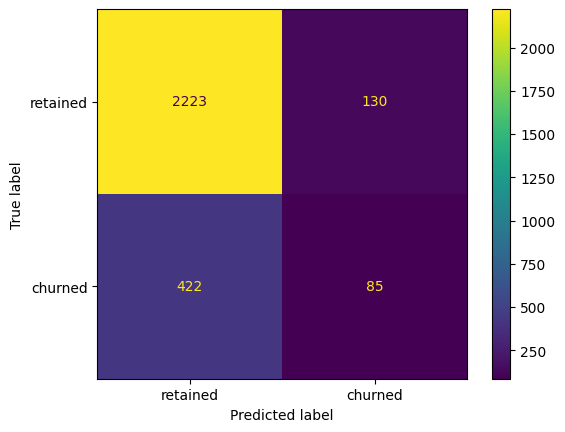

In [131]:
# generate a confusion matrix
cm = confusion_matrix(y_test, xgb_test_preds, labels=xgb_cv.classes_)

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                             display_labels=['retained', 'churned'])
disp.plot()

**Observation :**
- The model predicted three times as many false negatives than it did false positives, and it correctly identified only 16.6% of the users who actually churned

## Feature importance

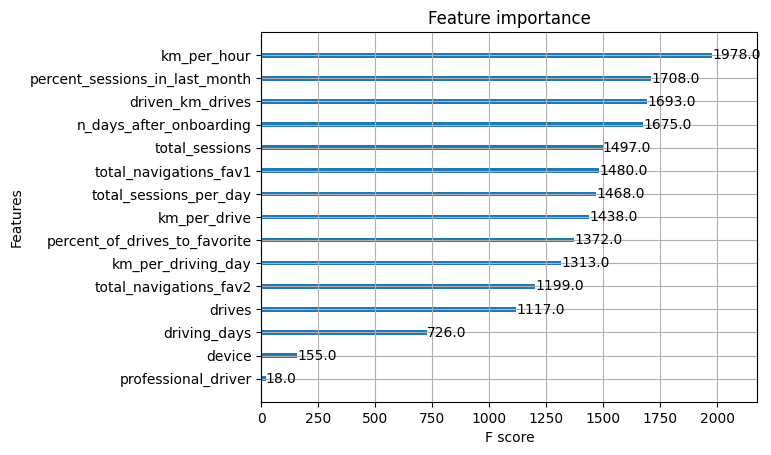

In [132]:
plot_importance(xgb_cv.best_estimator_);

**Observation :**
- The XGBoost model made more use of many of the features than did the logistic regression model from the previous course

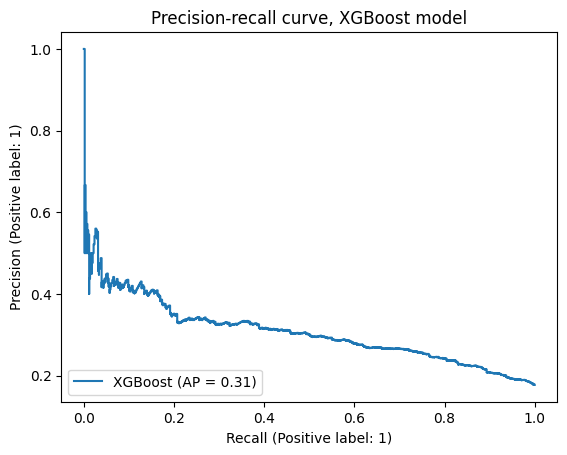

In [133]:
# Plot precision-recall curve
from sklearn.metrics import PrecisionRecallDisplay
display = PrecisionRecallDisplay.from_estimator(
     xgb_cv.best_estimator_, X_test, y_test, name='XGBoost'
    )
plt.title('Precision-recall curve, XGBoost model');

**Observation:**
- As recall increases, precision decreases

In [134]:
dfh=temp_df

In [135]:
dfh.shape

(14999, 13)

## Hypothesis Testing

In [136]:
# calculate counts of churned vs. retained
print(dfh['label'].value_counts())
print()
print(dfh['label'].value_counts(normalize=True))

# calculate median values of all columns for churned and retained users
dfh.groupby('label').median(numeric_only=True)


retained    11763
churned      2536
Name: label, dtype: int64

retained    0.822645
churned     0.177355
Name: label, dtype: float64


,ID,sessions,drives,total_sessions,n_days_after_onboarding,total_navigations_fav1,total_navigations_fav2,driven_km_drives,duration_minutes_drives,activity_days,driving_days
label,,,,,,,,,,,
churned,7477.5,59.0,50.0,164.339042,1321.0,84.5,11.0,3652.655666,1607.183785,8.0,6.0
retained,7509.0,56.0,47.0,157.586756,1843.0,68.0,9.0,3464.684614,1458.046141,17.0,14.0


**Observation :**
- Churned users had more no. of drives than retained users in a given month; 50 drives vs. 47 drives
- Churned users used the app less no. of times than retained users in a given month; 8 times vs. 17 times
- Churned users used the app less no. of days than retained users in a given month; 6 days vs. 14 days
- Churned users drove more frequently than retained users in a short-period of time and used the app less number of times

## Questions & Answers

In [137]:
## Question 1: What is the median driving distance per drive?

# calculate median values of all columns for churned and retained users
dfh.groupby('label').median(numeric_only=True)

# calculate median distance in km per drive
medians_by_label = dfh.groupby('label').median(numeric_only=True)
print('Median distance (in km) per drive:')
medians_by_label['driven_km_drives'] / medians_by_label['drives']

Median distance (in km) per drive:


label
churned     73.053113
retained    73.716694
dtype: float64

**Observation :**
- The median distance that both churned and retained users drove per drive is the same (73.1 km per drive vs. 73.7 km per drive)

In [138]:
## Question 2: What is the median dirving distance per driving day?

# calculate median values of all columns for churned and retained users
dfh.groupby('label').median(numeric_only=True)

# calculate median distance in km per driving day
medians_by_label = dfh.groupby('label').median(numeric_only=True)
print('Median distance (in km) per driving day:')
medians_by_label['driven_km_drives'] / medians_by_label['driving_days']

Median distance (in km) per driving day:


label
churned     608.775944
retained    247.477472
dtype: float64

**Observation :**
- Churned users drove "longer in distance" than retained users in a given driving day (608.8 km per driving day vs. 247.5 km per driving day)
- Churned users made "longer distance travels in in a driving day" than retained users

In [139]:
## Question 3: What is the median number of drives per driving day?

# calculate median values of all columns for churned and retained users
dfh.groupby('label').median(numeric_only=True)

# calculate median no. of drives per driving day
medians_by_label = dfh.groupby('label').median(numeric_only=True)
print('Median no. of drives per driving day:')
medians_by_label['drives'] / medians_by_label['driving_days']

Median no. of drives per driving day:


label
churned     8.333333
retained    3.357143
dtype: float64

**Observation :**
- 64% of iPhone users vs. 36% of Android users

In [140]:
## Question 4: What percentage of the users are Android users vs. iPhone users?

# calculate the no. of Android vs. iPhone users
print(dfh['device'].value_counts())

# calculate the proportion
print(dfh['device'].value_counts(normalize=True))

iPhone     9672
Android    5327
Name: device, dtype: int64
iPhone     0.644843
Android    0.355157
Name: device, dtype: float64


**Observation :**
- It appears that more iPhone users fall into this category. But before we jump to any conlcusions, lets see the ratio of iPhone users vs Android users in the overall dataset

In [141]:
## Question 5: Can we break down the users by label (i.e. churned vs. retained) and by device (iPhone vs. Android)?

# display the no. of different device users
dfh.groupby(['label', 'device']).size()

# calculate the proportion

dfh.groupby('label')['device'].value_counts(normalize=True)

label     device 
churned   iPhone     0.648659
          Android    0.351341
retained  iPhone     0.644393
          Android    0.355607
Name: device, dtype: float64

**Observation :**
- It seems the ratio of iPhone users and Android users is consistent between the churned group and the retained group

## Hypothesis testing

In [142]:
# Open source module designed specifically for statistics; necessary for visualize data, hypothesis testing and more
from scipy import stats

In [143]:
# need to convert a categorical variable, "device" to a numerical variable
map_dictionary  = {'iPhone': 0, 'Android': 1}
dfh['tmp_device'] = dfh['device']
dfh['tmp_device'] = dfh['device'].map(map_dictionary)
dfh['device'], dfh['tmp_device']

(0        Android
 1         iPhone
 2        Android
 3         iPhone
 4        Android
           ...   
 14994     iPhone
 14995    Android
 14996     iPhone
 14997     iPhone
 14998     iPhone
 Name: device, Length: 14999, dtype: object,
 0        1
 1        0
 2        1
 3        0
 4        1
         ..
 14994    0
 14995    1
 14996    0
 14997    0
 14998    0
 Name: tmp_device, Length: 14999, dtype: int64)

In [144]:
# generate descriptive statistics of mean; compare the mean drives between different devices
dfh.groupby('tmp_device')['drives'].mean()

tmp_device
0    67.859078
1    66.231838
Name: drives, dtype: float64

**Observation :**
- The mean difference between iPhone users and Android users is 1.627

In [145]:
# create two variables that store values in a column, 'drives'
drives_iPhone = dfh[dfh['tmp_device']==0]['drives'] # drives for iPhone users
drives_android = dfh[dfh['tmp_device']==1]['drives'] # drives for iPhone users

## Find the p-value

- Significance level = 0.05

In [146]:
stats.ttest_ind(a=drives_iPhone, b=drives_android, equal_var=False)

TtestResult(statistic=1.463523206885235, pvalue=0.143351972680206, df=11345.066049381952)

**Observation :**
- The p-value is 0.14 or 14%
- The p-value is larger than the significance level of 5%; therefore, fail to reject the null hypothesis.

In [147]:

map_dictionary  = {'retained': 0, 'churned': 1}
dfh['tmp_label'] = dfh['label']
dfh['tmp_label'] = dfh['label'].map(map_dictionary)
dfh['label'], dfh['tmp_label']


(0        retained
 1        retained
 2        retained
 3        retained
 4        retained
            ...   
 14994    retained
 14995    retained
 14996    retained
 14997     churned
 14998    retained
 Name: label, Length: 14999, dtype: object,
 0        0.0
 1        0.0
 2        0.0
 3        0.0
 4        0.0
         ... 
 14994    0.0
 14995    0.0
 14996    0.0
 14997    1.0
 14998    0.0
 Name: tmp_label, Length: 14999, dtype: float64)

In [148]:
drives_retained = dfh[dfh['tmp_label']==0]['label']
drives_churned = dfh[dfh['tmp_label']==1]['label']

## OLS Test

In [149]:
# use OLS to see coefficients
import statsmodels.api as sm
X_drives = df2[['driven_km_drives','drives']]
y_label = df2['label']
label = sm.OLS(y_label, X_drives)
results_label = label.fit()
results_label.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                  label   R-squared (uncentered):                   0.151
Model:                            OLS   Adj. R-squared (uncentered):              0.151
Method:                 Least Squares   F-statistic:                              1274.
Date:                Thu, 21 Dec 2023   Prob (F-statistic):                        0.00
Time:                        17:01:14   Log-Likelihood:                         -6751.2
No. Observations:               14299   AIC:                                  1.351e+04
Df Residuals:                   14297   BIC:                                  1.352e+04
Df Model:                           2                                                  
Covariance Type:            nonrobust                                                  
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
driven_km_drives  2.379e-05   8.59e-07     27.684      0.000    2.21e-05    2.55e-05
drives               0.0007   4.34e-05     16.652      0.000       0.001       0.001
==============================================================================
Omnibus:                     3406.835   Durbin-Watson:                   2.017
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             6396.345
Skew:                           1.588   Prob(JB):                         0.00
Kurtosis:                       3.804   Cond. No.                         63.6
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

**Observation :**
- drives has more influence in the retain n churn users then drive_km_drives

## Chi square test

In [150]:
# Claculate chi square test
import statsmodels.api as sm
index = ['retained','churned']
drives_tab = pd.crosstab(index=dfh.label, columns=dfh.drives)
drives_table = sm.stats.Table(drives_tab)
drives_rslt = drives_table.test_nominal_association()
drives_rslt.pvalue

0.8196279396644761

**Observation :**
- us the users drives for more time the churn rate is less